# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [ ]:
# run this once to unzip the file
# !unzip processed-celeba-small.zip

In [1]:


from glob import glob
from typing import Tuple, Callable, Dict
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, Resize, ToTensor, Normalize , CenterCrop

import pathlib
import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:

    
#     return Compose(transforms)
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [Resize(size[0]),
                  CenterCrop(size[0]),
                  ToTensor()
                  ]
    #Normalize([0.5, 0.5, 0.5],[0.5, 0.5, 0.5])
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:


class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        
        self.img_dir = list(pathlib.Path(directory).glob('*'+extension))
        self.transform = transforms
        # TODO: implement the init method

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.img_dir)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        image_path = self.img_dir[index]
        img = Image.open(image_path)
        image = self.transform(img)
        return image

In [5]:


"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

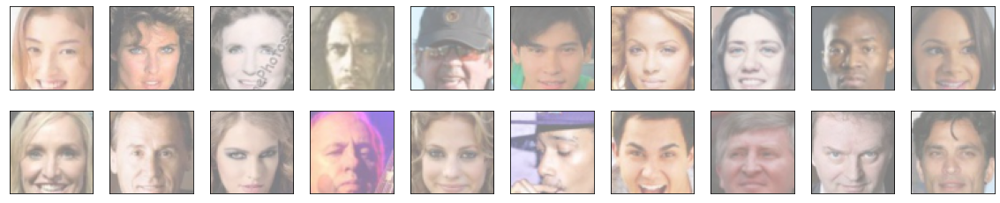

In [6]:


"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:

    
 # helper scale function
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    # assume x is scaled to (0, 1)
    # scale to feature_range and return scaled x
    ####
    arr_min, arr_max = feature_range
    x = x * (arr_max - arr_min) + arr_min
    ####
    return x

In [8]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)

In [9]:
from torch.nn import Module


In [10]:
class ConvBlock(Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation.
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = torch.nn.BatchNorm2d(out_channels)
        self.activation = torch.nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [11]:
class Discriminator(Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
         # complete init function
        ndf = 64
        nc = 3
        self.main = nn.Sequential(
            # input is ``(nc) x 64 x 64``
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf) x 32 x 32``
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*2) x 16 x 16``
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*4) x 8 x 8``
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. ``(ndf*8) x 4 x 4``
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            #nn.Dropout(p=0.2),
            #nn.Linear(ndf*4*4, 1),
            #nn.Sigmoid()
        )
#nn.Sigmoid()


      
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.main(x)      
        return x 

In [12]:
discriminator = Discriminator()
discriminator.apply(weights_init)

print(discriminator)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
  )
)


In [13]:

"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [14]:



class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        ngf = 64
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_dim, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. ``(ngf*8) x 4 x 4``
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. ``(ngf*4) x 8 x 8``
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. ``(ngf*2) x 16 x 16``
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. ``(ngf) x 32 x 32``
            nn.ConvTranspose2d(ngf, 3, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. ``(nc) x 64 x 64``
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.main(x)
        return x

In [15]:
generator = Generator(128)
generator.apply(weights_init)

print(generator)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [16]:


"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [17]:


import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    lr = 0.0002
    beta1 = 0.5
    beta2 = 0.999

    g_optimizer = torch.optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = torch.optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [18]:
import torch

# Check for a GPU
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('No GPU')
else:
    print('Training on GPU!')

Training on GPU!


In [19]:

def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    """
    Wasserstein Generator Loss
    
    args:
    - fake_logits: vector of logits outputed by the discriminator with a fake input image 
    """
    loss = -fake_logits.mean()
    return loss

In [20]:
def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size) # fake labels = 0
    if train_on_gpu:
        labels = labels.cuda()
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [21]:


def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    """
    Wasserstein Discriminator Loss
    
    args:
    - real_logits: vector of logits outputed by the discriminator with a real input image
    - fake_logits: vector of logits outputed by the discriminator with a fake input image 
    """
    ####
    real_loss = -real_logits.mean()
    fake_loss = fake_logits.mean()
    loss = real_loss + fake_loss
    ####
    return loss

In [22]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    # label smoothing
    if smooth:
        # smooth, real labels = 0.9
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) # real labels = 1
    # move labels to GPU if available     
    if train_on_gpu:
        labels = labels.cuda()
    # binary cross entropy with logits loss
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(D_out.squeeze(), labels)
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [23]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    ####

    ####
    return gp

In [24]:
def save_model(discriminator, generator, d_optimizer, g_optimizer, filename="face_dcgan_model.pt"):
    data = dict(
        discriminator=discriminator,
        generator=generator,
        d_optimizer=d_optimizer,
        g_optimizer=g_optimizer
    )
    torch.save(data, filename)

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [25]:

def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()
    z= np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z= torch.from_numpy(z).float()
    
    if train_on_gpu:
        z = z.cuda()
            
    fake_images = generator(z)
        
    D_fake = discriminator(fake_images)
    g_loss = real_loss(D_fake, True)
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()
    D_real = discriminator(real_images)
    

    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    
    if train_on_gpu:
        z = z.cuda()
    
    fake_images = generator(z)
    
    D_fake = discriminator(fake_images.detach())
    
    d_real_loss = real_loss(D_real, True)
    
    d_fake_loss = fake_loss(D_fake) 
    d_loss = d_real_loss + d_fake_loss
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': 0}
    

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [26]:
from datetime import datetime
import pickle as pkl

In [28]:
#  you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 50

# number of images in each batch
batch_size = 64

In [29]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 5

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [30]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-08-28 11:00:21 | Epoch [1/50] | Batch 0/509 | d_loss: 0.8487 | g_loss: 2.2235
2023-08-28 11:00:23 | Epoch [1/50] | Batch 5/509 | d_loss: 0.6798 | g_loss: 2.9247
2023-08-28 11:00:24 | Epoch [1/50] | Batch 10/509 | d_loss: 0.6455 | g_loss: 2.5316
2023-08-28 11:00:25 | Epoch [1/50] | Batch 15/509 | d_loss: 0.5487 | g_loss: 4.4145
2023-08-28 11:00:26 | Epoch [1/50] | Batch 20/509 | d_loss: 0.6976 | g_loss: 2.6532
2023-08-28 11:00:27 | Epoch [1/50] | Batch 25/509 | d_loss: 0.5819 | g_loss: 3.7729
2023-08-28 11:00:28 | Epoch [1/50] | Batch 30/509 | d_loss: 0.5993 | g_loss: 3.6804
2023-08-28 11:00:29 | Epoch [1/50] | Batch 35/509 | d_loss: 0.7422 | g_loss: 2.8392
2023-08-28 11:00:30 | Epoch [1/50] | Batch 40/509 | d_loss: 0.7249 | g_loss: 5.9679
2023-08-28 11:00:31 | Epoch [1/50] | Batch 45/509 | d_loss: 0.7773 | g_loss: 4.3751
2023-08-28 11:00:32 | Epoch [1/50] | Batch 50/509 | d_loss: 0.8056 | g_loss: 2.8136
2023-08-28 11:00:33 | Epoch [1/50] | Batch 55/509 | d_loss: 0.6364 | g_loss: 4

2023-08-28 11:02:03 | Epoch [1/50] | Batch 485/509 | d_loss: 1.1752 | g_loss: 6.0862
2023-08-28 11:02:04 | Epoch [1/50] | Batch 490/509 | d_loss: 1.3359 | g_loss: 6.1790
2023-08-28 11:02:05 | Epoch [1/50] | Batch 495/509 | d_loss: 0.6468 | g_loss: 1.5568
2023-08-28 11:02:06 | Epoch [1/50] | Batch 500/509 | d_loss: 0.6025 | g_loss: 2.4627
2023-08-28 11:02:07 | Epoch [1/50] | Batch 505/509 | d_loss: 0.7038 | g_loss: 2.4477


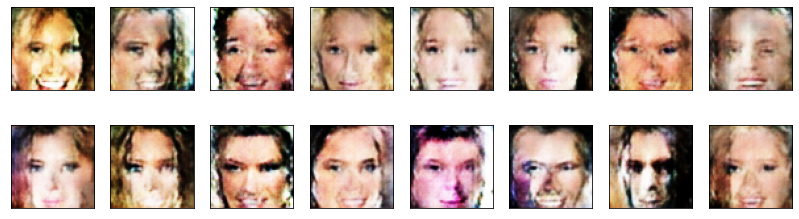

2023-08-28 11:02:12 | Epoch [2/50] | Batch 0/509 | d_loss: 0.5497 | g_loss: 3.1447
2023-08-28 11:02:14 | Epoch [2/50] | Batch 5/509 | d_loss: 0.5356 | g_loss: 3.1858
2023-08-28 11:02:15 | Epoch [2/50] | Batch 10/509 | d_loss: 0.6968 | g_loss: 4.6505
2023-08-28 11:02:16 | Epoch [2/50] | Batch 15/509 | d_loss: 0.5234 | g_loss: 2.8823
2023-08-28 11:02:17 | Epoch [2/50] | Batch 20/509 | d_loss: 0.6059 | g_loss: 3.7399
2023-08-28 11:02:18 | Epoch [2/50] | Batch 25/509 | d_loss: 0.5280 | g_loss: 3.5806
2023-08-28 11:02:20 | Epoch [2/50] | Batch 30/509 | d_loss: 0.4576 | g_loss: 3.6022
2023-08-28 11:02:20 | Epoch [2/50] | Batch 35/509 | d_loss: 1.6589 | g_loss: 1.6289
2023-08-28 11:02:22 | Epoch [2/50] | Batch 40/509 | d_loss: 0.6112 | g_loss: 3.0619
2023-08-28 11:02:23 | Epoch [2/50] | Batch 45/509 | d_loss: 0.8434 | g_loss: 5.1675
2023-08-28 11:02:24 | Epoch [2/50] | Batch 50/509 | d_loss: 0.9233 | g_loss: 5.0334
2023-08-28 11:02:25 | Epoch [2/50] | Batch 55/509 | d_loss: 0.5759 | g_loss: 3

2023-08-28 11:03:55 | Epoch [2/50] | Batch 485/509 | d_loss: 0.6759 | g_loss: 3.5363
2023-08-28 11:03:56 | Epoch [2/50] | Batch 490/509 | d_loss: 0.4910 | g_loss: 2.6743
2023-08-28 11:03:57 | Epoch [2/50] | Batch 495/509 | d_loss: 0.4501 | g_loss: 3.6403
2023-08-28 11:03:58 | Epoch [2/50] | Batch 500/509 | d_loss: 0.5146 | g_loss: 3.4564
2023-08-28 11:03:59 | Epoch [2/50] | Batch 505/509 | d_loss: 0.8926 | g_loss: 7.0098


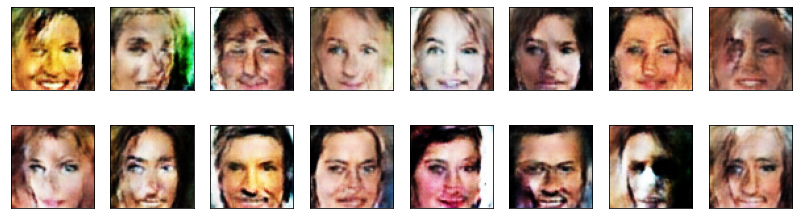

2023-08-28 11:04:04 | Epoch [3/50] | Batch 0/509 | d_loss: 0.5788 | g_loss: 2.1526
2023-08-28 11:04:05 | Epoch [3/50] | Batch 5/509 | d_loss: 0.5451 | g_loss: 2.6489
2023-08-28 11:04:06 | Epoch [3/50] | Batch 10/509 | d_loss: 0.5476 | g_loss: 3.6750
2023-08-28 11:04:07 | Epoch [3/50] | Batch 15/509 | d_loss: 2.2661 | g_loss: 2.6164
2023-08-28 11:04:08 | Epoch [3/50] | Batch 20/509 | d_loss: 0.9664 | g_loss: 1.5331
2023-08-28 11:04:09 | Epoch [3/50] | Batch 25/509 | d_loss: 0.6755 | g_loss: 3.5321
2023-08-28 11:04:10 | Epoch [3/50] | Batch 30/509 | d_loss: 0.7326 | g_loss: 2.6620
2023-08-28 11:04:11 | Epoch [3/50] | Batch 35/509 | d_loss: 0.6828 | g_loss: 3.4844
2023-08-28 11:04:12 | Epoch [3/50] | Batch 40/509 | d_loss: 0.5195 | g_loss: 2.9255
2023-08-28 11:04:13 | Epoch [3/50] | Batch 45/509 | d_loss: 0.5316 | g_loss: 3.7097
2023-08-28 11:04:14 | Epoch [3/50] | Batch 50/509 | d_loss: 0.6594 | g_loss: 5.0953
2023-08-28 11:04:15 | Epoch [3/50] | Batch 55/509 | d_loss: 0.4388 | g_loss: 2

2023-08-28 11:05:45 | Epoch [3/50] | Batch 485/509 | d_loss: 1.5062 | g_loss: 6.3868
2023-08-28 11:05:46 | Epoch [3/50] | Batch 490/509 | d_loss: 0.9175 | g_loss: 4.6650
2023-08-28 11:05:47 | Epoch [3/50] | Batch 495/509 | d_loss: 0.5533 | g_loss: 2.8337
2023-08-28 11:05:49 | Epoch [3/50] | Batch 500/509 | d_loss: 0.8750 | g_loss: 1.5906
2023-08-28 11:05:50 | Epoch [3/50] | Batch 505/509 | d_loss: 0.5319 | g_loss: 2.9793


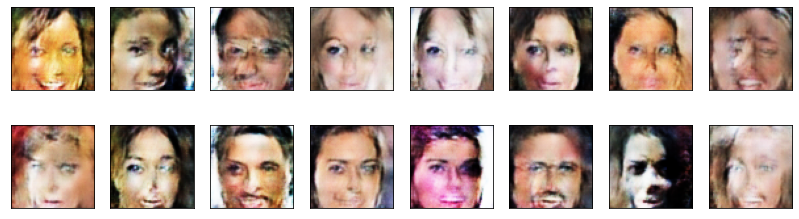

2023-08-28 11:05:54 | Epoch [4/50] | Batch 0/509 | d_loss: 0.8076 | g_loss: 3.7390
2023-08-28 11:05:55 | Epoch [4/50] | Batch 5/509 | d_loss: 0.5639 | g_loss: 2.9899
2023-08-28 11:05:56 | Epoch [4/50] | Batch 10/509 | d_loss: 0.4638 | g_loss: 2.9708
2023-08-28 11:05:57 | Epoch [4/50] | Batch 15/509 | d_loss: 0.5116 | g_loss: 2.7402
2023-08-28 11:05:58 | Epoch [4/50] | Batch 20/509 | d_loss: 0.8460 | g_loss: 2.5982
2023-08-28 11:05:59 | Epoch [4/50] | Batch 25/509 | d_loss: 0.4784 | g_loss: 2.7908
2023-08-28 11:06:01 | Epoch [4/50] | Batch 30/509 | d_loss: 0.4046 | g_loss: 3.9495
2023-08-28 11:06:02 | Epoch [4/50] | Batch 35/509 | d_loss: 0.4447 | g_loss: 3.1945
2023-08-28 11:06:03 | Epoch [4/50] | Batch 40/509 | d_loss: 0.5963 | g_loss: 2.0612
2023-08-28 11:06:04 | Epoch [4/50] | Batch 45/509 | d_loss: 0.4626 | g_loss: 2.5473
2023-08-28 11:06:05 | Epoch [4/50] | Batch 50/509 | d_loss: 0.6168 | g_loss: 2.6988
2023-08-28 11:06:06 | Epoch [4/50] | Batch 55/509 | d_loss: 0.4889 | g_loss: 3

2023-08-28 11:07:37 | Epoch [4/50] | Batch 485/509 | d_loss: 0.8724 | g_loss: 5.3969
2023-08-28 11:07:38 | Epoch [4/50] | Batch 490/509 | d_loss: 0.6005 | g_loss: 3.5555
2023-08-28 11:07:39 | Epoch [4/50] | Batch 495/509 | d_loss: 0.6760 | g_loss: 1.8359
2023-08-28 11:07:40 | Epoch [4/50] | Batch 500/509 | d_loss: 0.4691 | g_loss: 3.1966
2023-08-28 11:07:41 | Epoch [4/50] | Batch 505/509 | d_loss: 0.5287 | g_loss: 2.2028


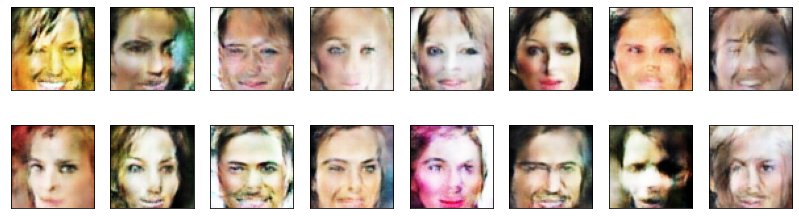

2023-08-28 11:07:46 | Epoch [5/50] | Batch 0/509 | d_loss: 0.9050 | g_loss: 4.8766
2023-08-28 11:07:47 | Epoch [5/50] | Batch 5/509 | d_loss: 0.4253 | g_loss: 3.0081
2023-08-28 11:07:48 | Epoch [5/50] | Batch 10/509 | d_loss: 0.5678 | g_loss: 1.8817
2023-08-28 11:07:49 | Epoch [5/50] | Batch 15/509 | d_loss: 0.6824 | g_loss: 3.0041
2023-08-28 11:07:50 | Epoch [5/50] | Batch 20/509 | d_loss: 0.4884 | g_loss: 3.7850
2023-08-28 11:07:51 | Epoch [5/50] | Batch 25/509 | d_loss: 0.4327 | g_loss: 2.9069
2023-08-28 11:07:53 | Epoch [5/50] | Batch 30/509 | d_loss: 0.4393 | g_loss: 2.9542
2023-08-28 11:07:54 | Epoch [5/50] | Batch 35/509 | d_loss: 0.5802 | g_loss: 4.8850
2023-08-28 11:07:55 | Epoch [5/50] | Batch 40/509 | d_loss: 0.4193 | g_loss: 3.3523
2023-08-28 11:07:56 | Epoch [5/50] | Batch 45/509 | d_loss: 0.4361 | g_loss: 4.5495
2023-08-28 11:07:57 | Epoch [5/50] | Batch 50/509 | d_loss: 2.6281 | g_loss: 1.4190
2023-08-28 11:07:58 | Epoch [5/50] | Batch 55/509 | d_loss: 0.6564 | g_loss: 2

2023-08-28 11:09:29 | Epoch [5/50] | Batch 485/509 | d_loss: 0.8160 | g_loss: 5.2993
2023-08-28 11:09:30 | Epoch [5/50] | Batch 490/509 | d_loss: 0.4683 | g_loss: 3.0754
2023-08-28 11:09:31 | Epoch [5/50] | Batch 495/509 | d_loss: 0.4720 | g_loss: 2.2990
2023-08-28 11:09:32 | Epoch [5/50] | Batch 500/509 | d_loss: 0.4770 | g_loss: 3.4535
2023-08-28 11:09:33 | Epoch [5/50] | Batch 505/509 | d_loss: 0.5891 | g_loss: 3.2223


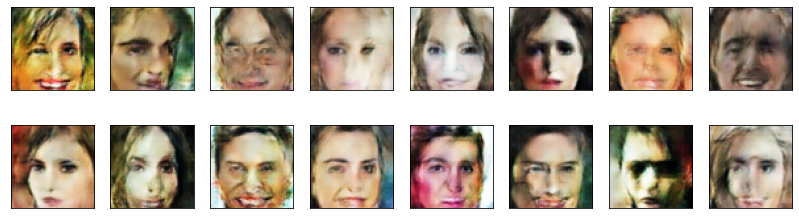

2023-08-28 11:09:38 | Epoch [6/50] | Batch 0/509 | d_loss: 0.5306 | g_loss: 2.7199
2023-08-28 11:09:39 | Epoch [6/50] | Batch 5/509 | d_loss: 0.5326 | g_loss: 3.7479
2023-08-28 11:09:40 | Epoch [6/50] | Batch 10/509 | d_loss: 0.4442 | g_loss: 3.4843
2023-08-28 11:09:41 | Epoch [6/50] | Batch 15/509 | d_loss: 0.4297 | g_loss: 3.7634
2023-08-28 11:09:42 | Epoch [6/50] | Batch 20/509 | d_loss: 0.5188 | g_loss: 3.0818
2023-08-28 11:09:43 | Epoch [6/50] | Batch 25/509 | d_loss: 0.4733 | g_loss: 3.3810
2023-08-28 11:09:44 | Epoch [6/50] | Batch 30/509 | d_loss: 0.5027 | g_loss: 3.6508
2023-08-28 11:09:45 | Epoch [6/50] | Batch 35/509 | d_loss: 1.2979 | g_loss: 6.1218
2023-08-28 11:09:47 | Epoch [6/50] | Batch 40/509 | d_loss: 0.7064 | g_loss: 5.1389
2023-08-28 11:09:48 | Epoch [6/50] | Batch 45/509 | d_loss: 0.7972 | g_loss: 4.6569
2023-08-28 11:09:49 | Epoch [6/50] | Batch 50/509 | d_loss: 0.6595 | g_loss: 1.8826
2023-08-28 11:09:50 | Epoch [6/50] | Batch 55/509 | d_loss: 0.4747 | g_loss: 3

2023-08-28 11:11:20 | Epoch [6/50] | Batch 485/509 | d_loss: 0.5055 | g_loss: 3.4568
2023-08-28 11:11:21 | Epoch [6/50] | Batch 490/509 | d_loss: 0.4574 | g_loss: 3.2032
2023-08-28 11:11:22 | Epoch [6/50] | Batch 495/509 | d_loss: 0.3756 | g_loss: 3.5569
2023-08-28 11:11:23 | Epoch [6/50] | Batch 500/509 | d_loss: 0.4782 | g_loss: 3.3188
2023-08-28 11:11:24 | Epoch [6/50] | Batch 505/509 | d_loss: 0.4527 | g_loss: 3.0788


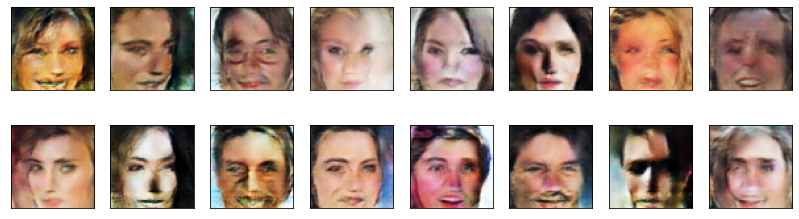

2023-08-28 11:11:28 | Epoch [7/50] | Batch 0/509 | d_loss: 0.3731 | g_loss: 3.6019
2023-08-28 11:11:30 | Epoch [7/50] | Batch 5/509 | d_loss: 0.3900 | g_loss: 4.1700
2023-08-28 11:11:31 | Epoch [7/50] | Batch 10/509 | d_loss: 0.4071 | g_loss: 3.5939
2023-08-28 11:11:32 | Epoch [7/50] | Batch 15/509 | d_loss: 0.4136 | g_loss: 2.5449
2023-08-28 11:11:33 | Epoch [7/50] | Batch 20/509 | d_loss: 0.5545 | g_loss: 2.5245
2023-08-28 11:11:34 | Epoch [7/50] | Batch 25/509 | d_loss: 0.4763 | g_loss: 3.1494
2023-08-28 11:11:35 | Epoch [7/50] | Batch 30/509 | d_loss: 0.9753 | g_loss: 6.1859
2023-08-28 11:11:36 | Epoch [7/50] | Batch 35/509 | d_loss: 0.4965 | g_loss: 3.7568
2023-08-28 11:11:37 | Epoch [7/50] | Batch 40/509 | d_loss: 0.4055 | g_loss: 3.7017
2023-08-28 11:11:38 | Epoch [7/50] | Batch 45/509 | d_loss: 0.5957 | g_loss: 4.4241
2023-08-28 11:11:39 | Epoch [7/50] | Batch 50/509 | d_loss: 0.3822 | g_loss: 2.5579
2023-08-28 11:11:40 | Epoch [7/50] | Batch 55/509 | d_loss: 0.5433 | g_loss: 3

2023-08-28 11:13:10 | Epoch [7/50] | Batch 485/509 | d_loss: 0.4358 | g_loss: 4.0160
2023-08-28 11:13:11 | Epoch [7/50] | Batch 490/509 | d_loss: 0.4328 | g_loss: 4.0817
2023-08-28 11:13:12 | Epoch [7/50] | Batch 495/509 | d_loss: 0.4646 | g_loss: 4.4404
2023-08-28 11:13:13 | Epoch [7/50] | Batch 500/509 | d_loss: 0.4382 | g_loss: 3.8900
2023-08-28 11:13:14 | Epoch [7/50] | Batch 505/509 | d_loss: 0.5021 | g_loss: 2.7627


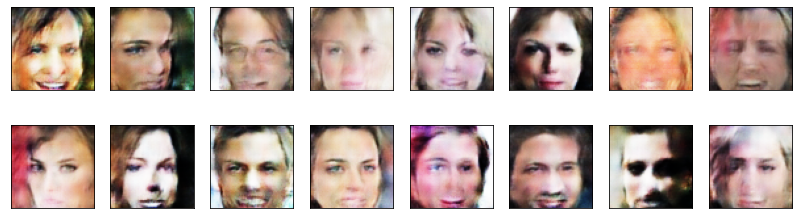

2023-08-28 11:13:19 | Epoch [8/50] | Batch 0/509 | d_loss: 0.6590 | g_loss: 3.7201
2023-08-28 11:13:20 | Epoch [8/50] | Batch 5/509 | d_loss: 0.3786 | g_loss: 4.8677
2023-08-28 11:13:22 | Epoch [8/50] | Batch 10/509 | d_loss: 0.5328 | g_loss: 4.6638
2023-08-28 11:13:23 | Epoch [8/50] | Batch 15/509 | d_loss: 1.7035 | g_loss: 6.4317
2023-08-28 11:13:24 | Epoch [8/50] | Batch 20/509 | d_loss: 0.6215 | g_loss: 4.6567
2023-08-28 11:13:25 | Epoch [8/50] | Batch 25/509 | d_loss: 0.4015 | g_loss: 2.2637
2023-08-28 11:13:26 | Epoch [8/50] | Batch 30/509 | d_loss: 0.4735 | g_loss: 4.2344
2023-08-28 11:13:27 | Epoch [8/50] | Batch 35/509 | d_loss: 0.4978 | g_loss: 2.8899
2023-08-28 11:13:28 | Epoch [8/50] | Batch 40/509 | d_loss: 0.4839 | g_loss: 2.9333
2023-08-28 11:13:29 | Epoch [8/50] | Batch 45/509 | d_loss: 0.6184 | g_loss: 7.2477
2023-08-28 11:13:30 | Epoch [8/50] | Batch 50/509 | d_loss: 0.5449 | g_loss: 4.0030
2023-08-28 11:13:31 | Epoch [8/50] | Batch 55/509 | d_loss: 0.3978 | g_loss: 4

2023-08-28 11:15:02 | Epoch [8/50] | Batch 485/509 | d_loss: 0.5783 | g_loss: 3.6008
2023-08-28 11:15:03 | Epoch [8/50] | Batch 490/509 | d_loss: 0.5496 | g_loss: 3.6911
2023-08-28 11:15:04 | Epoch [8/50] | Batch 495/509 | d_loss: 0.4531 | g_loss: 3.2409
2023-08-28 11:15:05 | Epoch [8/50] | Batch 500/509 | d_loss: 0.4992 | g_loss: 3.3672
2023-08-28 11:15:06 | Epoch [8/50] | Batch 505/509 | d_loss: 0.6173 | g_loss: 3.2002


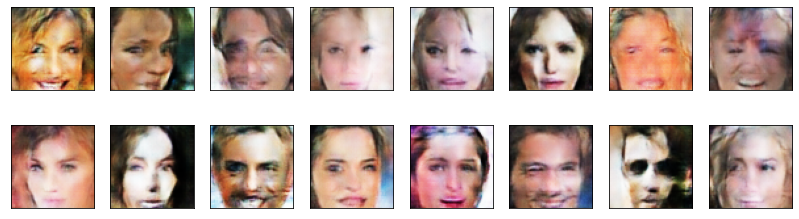

2023-08-28 11:15:12 | Epoch [9/50] | Batch 0/509 | d_loss: 0.5491 | g_loss: 3.9286
2023-08-28 11:15:13 | Epoch [9/50] | Batch 5/509 | d_loss: 0.6107 | g_loss: 3.9035
2023-08-28 11:15:14 | Epoch [9/50] | Batch 10/509 | d_loss: 0.8480 | g_loss: 5.4249
2023-08-28 11:15:16 | Epoch [9/50] | Batch 15/509 | d_loss: 0.4094 | g_loss: 3.7181
2023-08-28 11:15:17 | Epoch [9/50] | Batch 20/509 | d_loss: 0.4495 | g_loss: 3.5170
2023-08-28 11:15:18 | Epoch [9/50] | Batch 25/509 | d_loss: 0.4380 | g_loss: 3.1950
2023-08-28 11:15:19 | Epoch [9/50] | Batch 30/509 | d_loss: 0.6038 | g_loss: 1.9071
2023-08-28 11:15:20 | Epoch [9/50] | Batch 35/509 | d_loss: 0.3490 | g_loss: 6.9956
2023-08-28 11:15:21 | Epoch [9/50] | Batch 40/509 | d_loss: 0.3720 | g_loss: 3.8810
2023-08-28 11:15:22 | Epoch [9/50] | Batch 45/509 | d_loss: 0.3967 | g_loss: 3.4482
2023-08-28 11:15:23 | Epoch [9/50] | Batch 50/509 | d_loss: 0.7116 | g_loss: 5.3078
2023-08-28 11:15:24 | Epoch [9/50] | Batch 55/509 | d_loss: 0.4948 | g_loss: 2

2023-08-28 11:16:55 | Epoch [9/50] | Batch 485/509 | d_loss: 0.4136 | g_loss: 3.2405
2023-08-28 11:16:56 | Epoch [9/50] | Batch 490/509 | d_loss: 0.3914 | g_loss: 3.6955
2023-08-28 11:16:57 | Epoch [9/50] | Batch 495/509 | d_loss: 1.0387 | g_loss: 5.9435
2023-08-28 11:16:58 | Epoch [9/50] | Batch 500/509 | d_loss: 0.4566 | g_loss: 2.1583
2023-08-28 11:16:59 | Epoch [9/50] | Batch 505/509 | d_loss: 0.4581 | g_loss: 3.3573


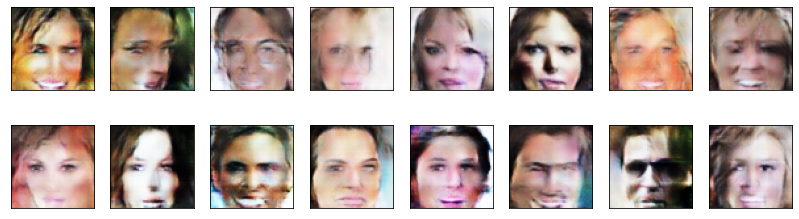

2023-08-28 11:17:03 | Epoch [10/50] | Batch 0/509 | d_loss: 0.4734 | g_loss: 3.8978
2023-08-28 11:17:04 | Epoch [10/50] | Batch 5/509 | d_loss: 0.7798 | g_loss: 4.9335
2023-08-28 11:17:06 | Epoch [10/50] | Batch 10/509 | d_loss: 0.3906 | g_loss: 3.5526
2023-08-28 11:17:07 | Epoch [10/50] | Batch 15/509 | d_loss: 0.4990 | g_loss: 3.6079
2023-08-28 11:17:08 | Epoch [10/50] | Batch 20/509 | d_loss: 0.3676 | g_loss: 4.6347
2023-08-28 11:17:09 | Epoch [10/50] | Batch 25/509 | d_loss: 0.3955 | g_loss: 4.5315
2023-08-28 11:17:10 | Epoch [10/50] | Batch 30/509 | d_loss: 0.5809 | g_loss: 4.0824
2023-08-28 11:17:11 | Epoch [10/50] | Batch 35/509 | d_loss: 0.6266 | g_loss: 4.0566
2023-08-28 11:17:12 | Epoch [10/50] | Batch 40/509 | d_loss: 0.4251 | g_loss: 3.2790
2023-08-28 11:17:13 | Epoch [10/50] | Batch 45/509 | d_loss: 0.3476 | g_loss: 5.5321
2023-08-28 11:17:14 | Epoch [10/50] | Batch 50/509 | d_loss: 0.3524 | g_loss: 6.3516
2023-08-28 11:17:15 | Epoch [10/50] | Batch 55/509 | d_loss: 0.3639

2023-08-28 11:18:45 | Epoch [10/50] | Batch 480/509 | d_loss: 0.3697 | g_loss: 3.6252
2023-08-28 11:18:46 | Epoch [10/50] | Batch 485/509 | d_loss: 0.3501 | g_loss: 4.4887
2023-08-28 11:18:47 | Epoch [10/50] | Batch 490/509 | d_loss: 0.3649 | g_loss: 4.5609
2023-08-28 11:18:48 | Epoch [10/50] | Batch 495/509 | d_loss: 0.4002 | g_loss: 3.1628
2023-08-28 11:18:49 | Epoch [10/50] | Batch 500/509 | d_loss: 0.4102 | g_loss: 5.1789
2023-08-28 11:18:50 | Epoch [10/50] | Batch 505/509 | d_loss: 0.4575 | g_loss: 4.5465


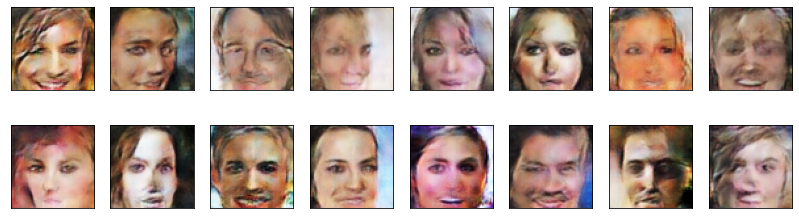

2023-08-28 11:18:55 | Epoch [11/50] | Batch 0/509 | d_loss: 0.3959 | g_loss: 6.8883
2023-08-28 11:18:56 | Epoch [11/50] | Batch 5/509 | d_loss: 0.3748 | g_loss: 3.7049
2023-08-28 11:18:57 | Epoch [11/50] | Batch 10/509 | d_loss: 0.4485 | g_loss: 3.4736
2023-08-28 11:18:58 | Epoch [11/50] | Batch 15/509 | d_loss: 1.5482 | g_loss: 3.0156
2023-08-28 11:19:00 | Epoch [11/50] | Batch 20/509 | d_loss: 0.4489 | g_loss: 2.4751
2023-08-28 11:19:01 | Epoch [11/50] | Batch 25/509 | d_loss: 0.4583 | g_loss: 3.9116
2023-08-28 11:19:02 | Epoch [11/50] | Batch 30/509 | d_loss: 0.5221 | g_loss: 4.6715
2023-08-28 11:19:03 | Epoch [11/50] | Batch 35/509 | d_loss: 0.7751 | g_loss: 2.3679
2023-08-28 11:19:04 | Epoch [11/50] | Batch 40/509 | d_loss: 0.4974 | g_loss: 2.3702
2023-08-28 11:19:05 | Epoch [11/50] | Batch 45/509 | d_loss: 0.3796 | g_loss: 3.4948
2023-08-28 11:19:06 | Epoch [11/50] | Batch 50/509 | d_loss: 0.8164 | g_loss: 5.3281
2023-08-28 11:19:07 | Epoch [11/50] | Batch 55/509 | d_loss: 0.5748

2023-08-28 11:20:37 | Epoch [11/50] | Batch 480/509 | d_loss: 0.3881 | g_loss: 4.8957
2023-08-28 11:20:38 | Epoch [11/50] | Batch 485/509 | d_loss: 0.4300 | g_loss: 8.3426
2023-08-28 11:20:39 | Epoch [11/50] | Batch 490/509 | d_loss: 0.3746 | g_loss: 4.5389
2023-08-28 11:20:40 | Epoch [11/50] | Batch 495/509 | d_loss: 0.4055 | g_loss: 4.9476
2023-08-28 11:20:41 | Epoch [11/50] | Batch 500/509 | d_loss: 0.4066 | g_loss: 4.6753
2023-08-28 11:20:42 | Epoch [11/50] | Batch 505/509 | d_loss: 0.5510 | g_loss: 3.1938


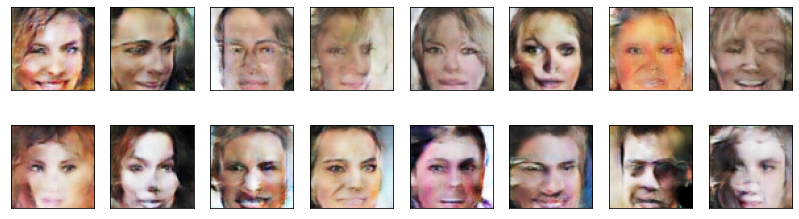

2023-08-28 11:20:47 | Epoch [12/50] | Batch 0/509 | d_loss: 0.8487 | g_loss: 4.0127
2023-08-28 11:20:48 | Epoch [12/50] | Batch 5/509 | d_loss: 0.4231 | g_loss: 4.0319
2023-08-28 11:20:49 | Epoch [12/50] | Batch 10/509 | d_loss: 0.3614 | g_loss: 5.1551
2023-08-28 11:20:50 | Epoch [12/50] | Batch 15/509 | d_loss: 0.3584 | g_loss: 3.5538
2023-08-28 11:20:51 | Epoch [12/50] | Batch 20/509 | d_loss: 0.3894 | g_loss: 3.4584
2023-08-28 11:20:52 | Epoch [12/50] | Batch 25/509 | d_loss: 0.4294 | g_loss: 3.5939
2023-08-28 11:20:54 | Epoch [12/50] | Batch 30/509 | d_loss: 0.8744 | g_loss: 6.0134
2023-08-28 11:20:55 | Epoch [12/50] | Batch 35/509 | d_loss: 0.3776 | g_loss: 5.2940
2023-08-28 11:20:56 | Epoch [12/50] | Batch 40/509 | d_loss: 0.3547 | g_loss: 4.3513
2023-08-28 11:20:57 | Epoch [12/50] | Batch 45/509 | d_loss: 0.5333 | g_loss: 4.8535
2023-08-28 11:20:58 | Epoch [12/50] | Batch 50/509 | d_loss: 0.3898 | g_loss: 4.4301
2023-08-28 11:20:59 | Epoch [12/50] | Batch 55/509 | d_loss: 0.3836

2023-08-28 11:22:28 | Epoch [12/50] | Batch 480/509 | d_loss: 0.4264 | g_loss: 4.8398
2023-08-28 11:22:29 | Epoch [12/50] | Batch 485/509 | d_loss: 0.3763 | g_loss: 7.7920
2023-08-28 11:22:31 | Epoch [12/50] | Batch 490/509 | d_loss: 0.3675 | g_loss: 3.7508
2023-08-28 11:22:32 | Epoch [12/50] | Batch 495/509 | d_loss: 0.3653 | g_loss: 3.3317
2023-08-28 11:22:33 | Epoch [12/50] | Batch 500/509 | d_loss: 0.6180 | g_loss: 7.5760
2023-08-28 11:22:34 | Epoch [12/50] | Batch 505/509 | d_loss: 0.3499 | g_loss: 7.4339


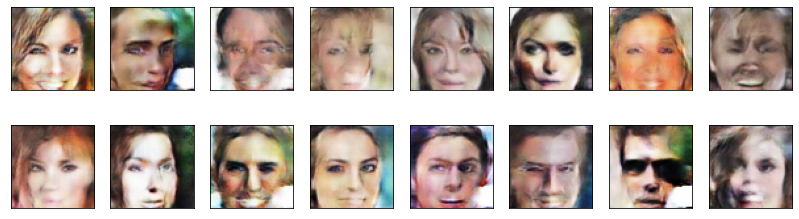

2023-08-28 11:22:39 | Epoch [13/50] | Batch 0/509 | d_loss: 0.3693 | g_loss: 4.3646
2023-08-28 11:22:40 | Epoch [13/50] | Batch 5/509 | d_loss: 0.3494 | g_loss: 7.9510
2023-08-28 11:22:41 | Epoch [13/50] | Batch 10/509 | d_loss: 0.3436 | g_loss: 7.5057
2023-08-28 11:22:42 | Epoch [13/50] | Batch 15/509 | d_loss: 0.4574 | g_loss: 4.1575
2023-08-28 11:22:43 | Epoch [13/50] | Batch 20/509 | d_loss: 0.3812 | g_loss: 3.8748
2023-08-28 11:22:44 | Epoch [13/50] | Batch 25/509 | d_loss: 0.4406 | g_loss: 8.1239
2023-08-28 11:22:45 | Epoch [13/50] | Batch 30/509 | d_loss: 0.3536 | g_loss: 4.8783
2023-08-28 11:22:46 | Epoch [13/50] | Batch 35/509 | d_loss: 0.3551 | g_loss: 7.9880
2023-08-28 11:22:47 | Epoch [13/50] | Batch 40/509 | d_loss: 0.3956 | g_loss: 3.9281
2023-08-28 11:22:48 | Epoch [13/50] | Batch 45/509 | d_loss: 0.3896 | g_loss: 4.1395
2023-08-28 11:22:49 | Epoch [13/50] | Batch 50/509 | d_loss: 0.3670 | g_loss: 4.2186
2023-08-28 11:22:50 | Epoch [13/50] | Batch 55/509 | d_loss: 0.4438

2023-08-28 11:24:21 | Epoch [13/50] | Batch 480/509 | d_loss: 0.6092 | g_loss: 4.5028
2023-08-28 11:24:22 | Epoch [13/50] | Batch 485/509 | d_loss: 0.4070 | g_loss: 4.1734
2023-08-28 11:24:23 | Epoch [13/50] | Batch 490/509 | d_loss: 0.4067 | g_loss: 3.5935
2023-08-28 11:24:24 | Epoch [13/50] | Batch 495/509 | d_loss: 0.3634 | g_loss: 5.4631
2023-08-28 11:24:25 | Epoch [13/50] | Batch 500/509 | d_loss: 0.6793 | g_loss: 3.6899
2023-08-28 11:24:26 | Epoch [13/50] | Batch 505/509 | d_loss: 0.4931 | g_loss: 4.3470


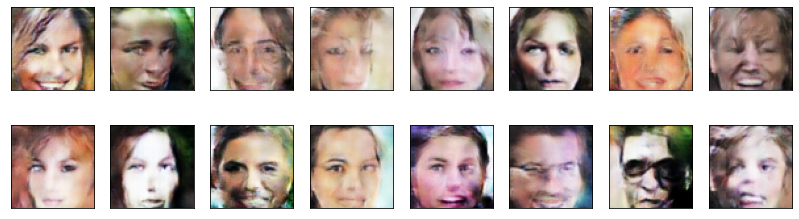

2023-08-28 11:24:31 | Epoch [14/50] | Batch 0/509 | d_loss: 0.4561 | g_loss: 3.7002
2023-08-28 11:24:32 | Epoch [14/50] | Batch 5/509 | d_loss: 0.4503 | g_loss: 3.1031
2023-08-28 11:24:33 | Epoch [14/50] | Batch 10/509 | d_loss: 0.4780 | g_loss: 3.5590
2023-08-28 11:24:34 | Epoch [14/50] | Batch 15/509 | d_loss: 0.4772 | g_loss: 3.9636
2023-08-28 11:24:36 | Epoch [14/50] | Batch 20/509 | d_loss: 0.3923 | g_loss: 3.3033
2023-08-28 11:24:37 | Epoch [14/50] | Batch 25/509 | d_loss: 0.4134 | g_loss: 2.6884
2023-08-28 11:24:38 | Epoch [14/50] | Batch 30/509 | d_loss: 0.4880 | g_loss: 6.7591
2023-08-28 11:24:39 | Epoch [14/50] | Batch 35/509 | d_loss: 0.4086 | g_loss: 4.0373
2023-08-28 11:24:40 | Epoch [14/50] | Batch 40/509 | d_loss: 0.4916 | g_loss: 6.0914
2023-08-28 11:24:41 | Epoch [14/50] | Batch 45/509 | d_loss: 0.3643 | g_loss: 5.1943
2023-08-28 11:24:42 | Epoch [14/50] | Batch 50/509 | d_loss: 0.3615 | g_loss: 5.7921
2023-08-28 11:24:43 | Epoch [14/50] | Batch 55/509 | d_loss: 0.4680

2023-08-28 11:26:12 | Epoch [14/50] | Batch 480/509 | d_loss: 0.4680 | g_loss: 3.5348
2023-08-28 11:26:13 | Epoch [14/50] | Batch 485/509 | d_loss: 0.4285 | g_loss: 4.4557
2023-08-28 11:26:14 | Epoch [14/50] | Batch 490/509 | d_loss: 0.3618 | g_loss: 4.6671
2023-08-28 11:26:15 | Epoch [14/50] | Batch 495/509 | d_loss: 0.4000 | g_loss: 3.7883
2023-08-28 11:26:16 | Epoch [14/50] | Batch 500/509 | d_loss: 0.3908 | g_loss: 3.1774
2023-08-28 11:26:17 | Epoch [14/50] | Batch 505/509 | d_loss: 0.6390 | g_loss: 2.4733


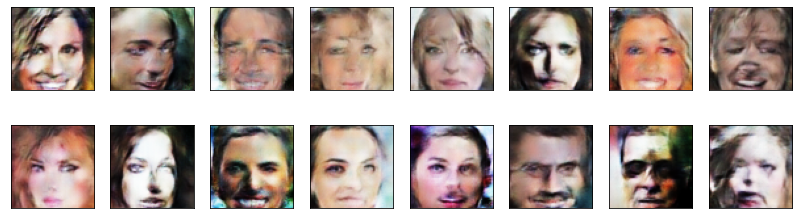

2023-08-28 11:26:21 | Epoch [15/50] | Batch 0/509 | d_loss: 0.5114 | g_loss: 3.6750
2023-08-28 11:26:23 | Epoch [15/50] | Batch 5/509 | d_loss: 0.3756 | g_loss: 4.4529
2023-08-28 11:26:24 | Epoch [15/50] | Batch 10/509 | d_loss: 0.3773 | g_loss: 4.2452
2023-08-28 11:26:25 | Epoch [15/50] | Batch 15/509 | d_loss: 0.3815 | g_loss: 3.7405
2023-08-28 11:26:26 | Epoch [15/50] | Batch 20/509 | d_loss: 0.4065 | g_loss: 3.0940
2023-08-28 11:26:27 | Epoch [15/50] | Batch 25/509 | d_loss: 0.4871 | g_loss: 4.8321
2023-08-28 11:26:28 | Epoch [15/50] | Batch 30/509 | d_loss: 0.4620 | g_loss: 4.6090
2023-08-28 11:26:29 | Epoch [15/50] | Batch 35/509 | d_loss: 0.4209 | g_loss: 3.3319
2023-08-28 11:26:30 | Epoch [15/50] | Batch 40/509 | d_loss: 0.4543 | g_loss: 3.7454
2023-08-28 11:26:31 | Epoch [15/50] | Batch 45/509 | d_loss: 0.3901 | g_loss: 3.7940
2023-08-28 11:26:32 | Epoch [15/50] | Batch 50/509 | d_loss: 0.3852 | g_loss: 3.5490
2023-08-28 11:26:33 | Epoch [15/50] | Batch 55/509 | d_loss: 1.0164

2023-08-28 11:28:03 | Epoch [15/50] | Batch 480/509 | d_loss: 0.3692 | g_loss: 4.4298
2023-08-28 11:28:04 | Epoch [15/50] | Batch 485/509 | d_loss: 0.4216 | g_loss: 3.9717
2023-08-28 11:28:05 | Epoch [15/50] | Batch 490/509 | d_loss: 0.3563 | g_loss: 4.5997
2023-08-28 11:28:06 | Epoch [15/50] | Batch 495/509 | d_loss: 0.3849 | g_loss: 3.3737
2023-08-28 11:28:07 | Epoch [15/50] | Batch 500/509 | d_loss: 0.3700 | g_loss: 3.8624
2023-08-28 11:28:08 | Epoch [15/50] | Batch 505/509 | d_loss: 0.3832 | g_loss: 3.8200


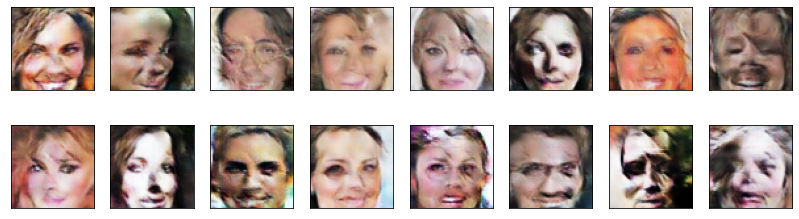

2023-08-28 11:28:13 | Epoch [16/50] | Batch 0/509 | d_loss: 0.5126 | g_loss: 2.8302
2023-08-28 11:28:14 | Epoch [16/50] | Batch 5/509 | d_loss: 0.3549 | g_loss: 6.0676
2023-08-28 11:28:15 | Epoch [16/50] | Batch 10/509 | d_loss: 0.3641 | g_loss: 4.1667
2023-08-28 11:28:16 | Epoch [16/50] | Batch 15/509 | d_loss: 0.4261 | g_loss: 2.9803
2023-08-28 11:28:17 | Epoch [16/50] | Batch 20/509 | d_loss: 0.3743 | g_loss: 4.2506
2023-08-28 11:28:18 | Epoch [16/50] | Batch 25/509 | d_loss: 0.3547 | g_loss: 5.9918
2023-08-28 11:28:19 | Epoch [16/50] | Batch 30/509 | d_loss: 0.4129 | g_loss: 4.3516
2023-08-28 11:28:20 | Epoch [16/50] | Batch 35/509 | d_loss: 0.4096 | g_loss: 4.8266
2023-08-28 11:28:21 | Epoch [16/50] | Batch 40/509 | d_loss: 0.4391 | g_loss: 4.7081
2023-08-28 11:28:22 | Epoch [16/50] | Batch 45/509 | d_loss: 0.3754 | g_loss: 3.3165
2023-08-28 11:28:23 | Epoch [16/50] | Batch 50/509 | d_loss: 0.3546 | g_loss: 5.0856
2023-08-28 11:28:24 | Epoch [16/50] | Batch 55/509 | d_loss: 0.4043

2023-08-28 11:29:52 | Epoch [16/50] | Batch 480/509 | d_loss: 0.3904 | g_loss: 4.6727
2023-08-28 11:29:53 | Epoch [16/50] | Batch 485/509 | d_loss: 0.3946 | g_loss: 5.2645
2023-08-28 11:29:54 | Epoch [16/50] | Batch 490/509 | d_loss: 0.3457 | g_loss: 4.8045
2023-08-28 11:29:55 | Epoch [16/50] | Batch 495/509 | d_loss: 0.3832 | g_loss: 3.6190
2023-08-28 11:29:56 | Epoch [16/50] | Batch 500/509 | d_loss: 0.6377 | g_loss: 2.6067
2023-08-28 11:29:57 | Epoch [16/50] | Batch 505/509 | d_loss: 0.3968 | g_loss: 4.2256


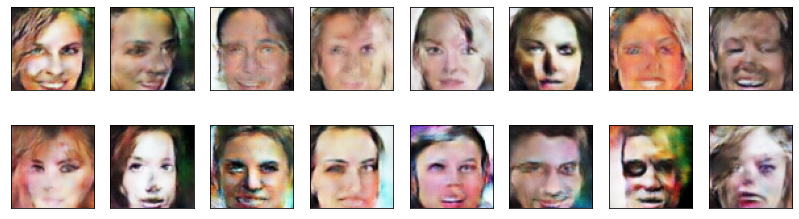

2023-08-28 11:30:02 | Epoch [17/50] | Batch 0/509 | d_loss: 0.4429 | g_loss: 3.7618
2023-08-28 11:30:03 | Epoch [17/50] | Batch 5/509 | d_loss: 0.3566 | g_loss: 8.4536
2023-08-28 11:30:04 | Epoch [17/50] | Batch 10/509 | d_loss: 0.3785 | g_loss: 4.9435
2023-08-28 11:30:05 | Epoch [17/50] | Batch 15/509 | d_loss: 0.3478 | g_loss: 7.1627
2023-08-28 11:30:06 | Epoch [17/50] | Batch 20/509 | d_loss: 0.3910 | g_loss: 4.0295
2023-08-28 11:30:07 | Epoch [17/50] | Batch 25/509 | d_loss: 0.3726 | g_loss: 3.7368
2023-08-28 11:30:08 | Epoch [17/50] | Batch 30/509 | d_loss: 0.3534 | g_loss: 5.3646
2023-08-28 11:30:09 | Epoch [17/50] | Batch 35/509 | d_loss: 0.3655 | g_loss: 6.7201
2023-08-28 11:30:10 | Epoch [17/50] | Batch 40/509 | d_loss: 0.4765 | g_loss: 4.3593
2023-08-28 11:30:11 | Epoch [17/50] | Batch 45/509 | d_loss: 0.3587 | g_loss: 3.6747
2023-08-28 11:30:12 | Epoch [17/50] | Batch 50/509 | d_loss: 0.3485 | g_loss: 5.4898
2023-08-28 11:30:13 | Epoch [17/50] | Batch 55/509 | d_loss: 0.4226

2023-08-28 11:31:42 | Epoch [17/50] | Batch 480/509 | d_loss: 0.9167 | g_loss: 1.8249
2023-08-28 11:31:43 | Epoch [17/50] | Batch 485/509 | d_loss: 0.4595 | g_loss: 3.7694
2023-08-28 11:31:44 | Epoch [17/50] | Batch 490/509 | d_loss: 0.4927 | g_loss: 2.7696
2023-08-28 11:31:45 | Epoch [17/50] | Batch 495/509 | d_loss: 0.4677 | g_loss: 2.9962
2023-08-28 11:31:46 | Epoch [17/50] | Batch 500/509 | d_loss: 0.4158 | g_loss: 3.6658
2023-08-28 11:31:47 | Epoch [17/50] | Batch 505/509 | d_loss: 0.3891 | g_loss: 5.1352


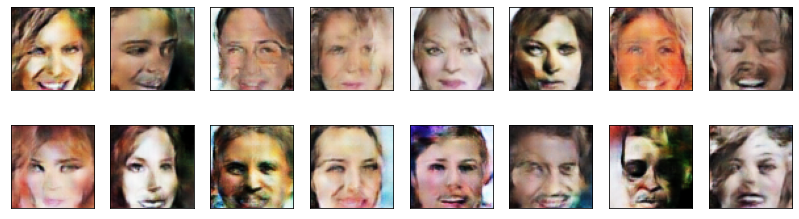

2023-08-28 11:31:52 | Epoch [18/50] | Batch 0/509 | d_loss: 0.4769 | g_loss: 2.7198
2023-08-28 11:31:53 | Epoch [18/50] | Batch 5/509 | d_loss: 0.3670 | g_loss: 4.1341
2023-08-28 11:31:54 | Epoch [18/50] | Batch 10/509 | d_loss: 0.5609 | g_loss: 4.0122
2023-08-28 11:31:55 | Epoch [18/50] | Batch 15/509 | d_loss: 0.4187 | g_loss: 4.8936
2023-08-28 11:31:56 | Epoch [18/50] | Batch 20/509 | d_loss: 0.4527 | g_loss: 4.7889
2023-08-28 11:31:57 | Epoch [18/50] | Batch 25/509 | d_loss: 0.3936 | g_loss: 4.3530
2023-08-28 11:31:58 | Epoch [18/50] | Batch 30/509 | d_loss: 1.2156 | g_loss: 3.6807
2023-08-28 11:31:59 | Epoch [18/50] | Batch 35/509 | d_loss: 0.3970 | g_loss: 6.7486
2023-08-28 11:32:00 | Epoch [18/50] | Batch 40/509 | d_loss: 0.4577 | g_loss: 4.9972
2023-08-28 11:32:01 | Epoch [18/50] | Batch 45/509 | d_loss: 0.5127 | g_loss: 2.8459
2023-08-28 11:32:02 | Epoch [18/50] | Batch 50/509 | d_loss: 0.5024 | g_loss: 3.9778
2023-08-28 11:32:03 | Epoch [18/50] | Batch 55/509 | d_loss: 0.5037

2023-08-28 11:33:32 | Epoch [18/50] | Batch 480/509 | d_loss: 0.4171 | g_loss: 2.9290
2023-08-28 11:33:33 | Epoch [18/50] | Batch 485/509 | d_loss: 0.6391 | g_loss: 1.8356
2023-08-28 11:33:34 | Epoch [18/50] | Batch 490/509 | d_loss: 0.4222 | g_loss: 4.0382
2023-08-28 11:33:35 | Epoch [18/50] | Batch 495/509 | d_loss: 0.5116 | g_loss: 3.5262
2023-08-28 11:33:36 | Epoch [18/50] | Batch 500/509 | d_loss: 0.3942 | g_loss: 3.0710
2023-08-28 11:33:37 | Epoch [18/50] | Batch 505/509 | d_loss: 2.0454 | g_loss: 1.5626


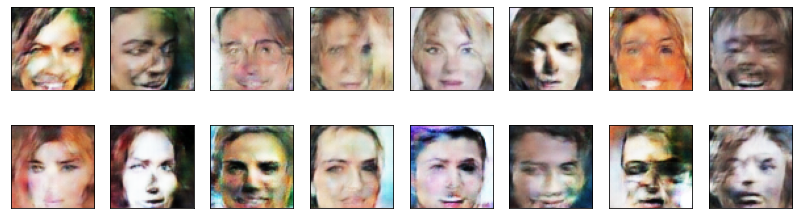

2023-08-28 11:33:42 | Epoch [19/50] | Batch 0/509 | d_loss: 0.4116 | g_loss: 3.9498
2023-08-28 11:33:43 | Epoch [19/50] | Batch 5/509 | d_loss: 0.6081 | g_loss: 3.3333
2023-08-28 11:33:44 | Epoch [19/50] | Batch 10/509 | d_loss: 0.3933 | g_loss: 3.7040
2023-08-28 11:33:45 | Epoch [19/50] | Batch 15/509 | d_loss: 0.3707 | g_loss: 4.8973
2023-08-28 11:33:46 | Epoch [19/50] | Batch 20/509 | d_loss: 0.3727 | g_loss: 3.9774
2023-08-28 11:33:48 | Epoch [19/50] | Batch 25/509 | d_loss: 0.4066 | g_loss: 5.4809
2023-08-28 11:33:49 | Epoch [19/50] | Batch 30/509 | d_loss: 0.4349 | g_loss: 3.8522
2023-08-28 11:33:50 | Epoch [19/50] | Batch 35/509 | d_loss: 0.5881 | g_loss: 3.4822
2023-08-28 11:33:51 | Epoch [19/50] | Batch 40/509 | d_loss: 0.3913 | g_loss: 5.1740
2023-08-28 11:33:52 | Epoch [19/50] | Batch 45/509 | d_loss: 0.6868 | g_loss: 4.5899
2023-08-28 11:33:53 | Epoch [19/50] | Batch 50/509 | d_loss: 0.5021 | g_loss: 3.3215
2023-08-28 11:33:54 | Epoch [19/50] | Batch 55/509 | d_loss: 0.4968

2023-08-28 11:35:22 | Epoch [19/50] | Batch 480/509 | d_loss: 0.3422 | g_loss: 6.8073
2023-08-28 11:35:23 | Epoch [19/50] | Batch 485/509 | d_loss: 0.3825 | g_loss: 3.7509
2023-08-28 11:35:24 | Epoch [19/50] | Batch 490/509 | d_loss: 0.3726 | g_loss: 4.1369
2023-08-28 11:35:25 | Epoch [19/50] | Batch 495/509 | d_loss: 0.3532 | g_loss: 6.7867
2023-08-28 11:35:26 | Epoch [19/50] | Batch 500/509 | d_loss: 0.3763 | g_loss: 4.4989
2023-08-28 11:35:27 | Epoch [19/50] | Batch 505/509 | d_loss: 0.3529 | g_loss: 5.9669


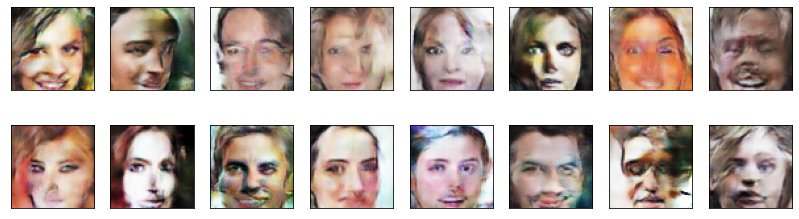

2023-08-28 11:35:32 | Epoch [20/50] | Batch 0/509 | d_loss: 0.3611 | g_loss: 5.3991
2023-08-28 11:35:33 | Epoch [20/50] | Batch 5/509 | d_loss: 4.8839 | g_loss: 1.1762
2023-08-28 11:35:34 | Epoch [20/50] | Batch 10/509 | d_loss: 0.5543 | g_loss: 2.7904
2023-08-28 11:35:35 | Epoch [20/50] | Batch 15/509 | d_loss: 0.5826 | g_loss: 2.4481
2023-08-28 11:35:36 | Epoch [20/50] | Batch 20/509 | d_loss: 0.4381 | g_loss: 3.3986
2023-08-28 11:35:37 | Epoch [20/50] | Batch 25/509 | d_loss: 0.5498 | g_loss: 4.3058
2023-08-28 11:35:38 | Epoch [20/50] | Batch 30/509 | d_loss: 0.5656 | g_loss: 2.0920
2023-08-28 11:35:39 | Epoch [20/50] | Batch 35/509 | d_loss: 0.4388 | g_loss: 4.7443
2023-08-28 11:35:41 | Epoch [20/50] | Batch 40/509 | d_loss: 0.4105 | g_loss: 3.2035
2023-08-28 11:35:42 | Epoch [20/50] | Batch 45/509 | d_loss: 0.4110 | g_loss: 4.1969
2023-08-28 11:35:43 | Epoch [20/50] | Batch 50/509 | d_loss: 0.4284 | g_loss: 4.1089
2023-08-28 11:35:44 | Epoch [20/50] | Batch 55/509 | d_loss: 0.4344

2023-08-28 11:37:13 | Epoch [20/50] | Batch 480/509 | d_loss: 0.6858 | g_loss: 6.2160
2023-08-28 11:37:14 | Epoch [20/50] | Batch 485/509 | d_loss: 0.6030 | g_loss: 2.1494
2023-08-28 11:37:15 | Epoch [20/50] | Batch 490/509 | d_loss: 0.4065 | g_loss: 4.0837
2023-08-28 11:37:16 | Epoch [20/50] | Batch 495/509 | d_loss: 0.3746 | g_loss: 4.5914
2023-08-28 11:37:17 | Epoch [20/50] | Batch 500/509 | d_loss: 0.3924 | g_loss: 4.5705
2023-08-28 11:37:18 | Epoch [20/50] | Batch 505/509 | d_loss: 0.6384 | g_loss: 2.2604


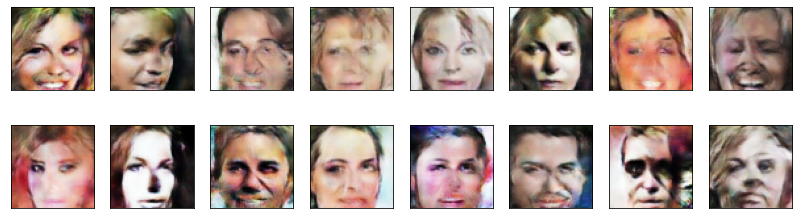

2023-08-28 11:37:23 | Epoch [21/50] | Batch 0/509 | d_loss: 0.8677 | g_loss: 5.7852
2023-08-28 11:37:24 | Epoch [21/50] | Batch 5/509 | d_loss: 0.6557 | g_loss: 4.4536
2023-08-28 11:37:25 | Epoch [21/50] | Batch 10/509 | d_loss: 0.4692 | g_loss: 4.5435
2023-08-28 11:37:26 | Epoch [21/50] | Batch 15/509 | d_loss: 0.4975 | g_loss: 4.4802
2023-08-28 11:37:27 | Epoch [21/50] | Batch 20/509 | d_loss: 0.4515 | g_loss: 3.9701
2023-08-28 11:37:28 | Epoch [21/50] | Batch 25/509 | d_loss: 0.4502 | g_loss: 3.2966
2023-08-28 11:37:30 | Epoch [21/50] | Batch 30/509 | d_loss: 0.5647 | g_loss: 4.1977
2023-08-28 11:37:31 | Epoch [21/50] | Batch 35/509 | d_loss: 0.4094 | g_loss: 4.1228
2023-08-28 11:37:32 | Epoch [21/50] | Batch 40/509 | d_loss: 0.3606 | g_loss: 5.8632
2023-08-28 11:37:33 | Epoch [21/50] | Batch 45/509 | d_loss: 0.5279 | g_loss: 3.0926
2023-08-28 11:37:34 | Epoch [21/50] | Batch 50/509 | d_loss: 0.4370 | g_loss: 4.2329
2023-08-28 11:37:35 | Epoch [21/50] | Batch 55/509 | d_loss: 0.4207

2023-08-28 11:39:04 | Epoch [21/50] | Batch 480/509 | d_loss: 0.5116 | g_loss: 6.9828
2023-08-28 11:39:05 | Epoch [21/50] | Batch 485/509 | d_loss: 0.5718 | g_loss: 4.5396
2023-08-28 11:39:06 | Epoch [21/50] | Batch 490/509 | d_loss: 0.3647 | g_loss: 3.9569
2023-08-28 11:39:07 | Epoch [21/50] | Batch 495/509 | d_loss: 0.3782 | g_loss: 4.4138
2023-08-28 11:39:08 | Epoch [21/50] | Batch 500/509 | d_loss: 0.4604 | g_loss: 3.3224
2023-08-28 11:39:09 | Epoch [21/50] | Batch 505/509 | d_loss: 0.3606 | g_loss: 5.3819


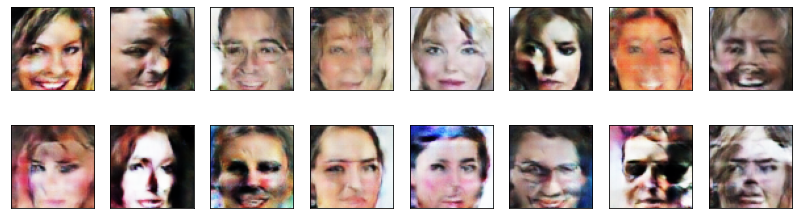

2023-08-28 11:39:14 | Epoch [22/50] | Batch 0/509 | d_loss: 0.5747 | g_loss: 5.0034
2023-08-28 11:39:15 | Epoch [22/50] | Batch 5/509 | d_loss: 0.3730 | g_loss: 3.7702
2023-08-28 11:39:16 | Epoch [22/50] | Batch 10/509 | d_loss: 0.4132 | g_loss: 4.1198
2023-08-28 11:39:17 | Epoch [22/50] | Batch 15/509 | d_loss: 0.4088 | g_loss: 4.4076
2023-08-28 11:39:18 | Epoch [22/50] | Batch 20/509 | d_loss: 0.3973 | g_loss: 3.4474
2023-08-28 11:39:19 | Epoch [22/50] | Batch 25/509 | d_loss: 0.3550 | g_loss: 5.0220
2023-08-28 11:39:20 | Epoch [22/50] | Batch 30/509 | d_loss: 0.4309 | g_loss: 2.9032
2023-08-28 11:39:21 | Epoch [22/50] | Batch 35/509 | d_loss: 0.3897 | g_loss: 4.1420
2023-08-28 11:39:23 | Epoch [22/50] | Batch 40/509 | d_loss: 0.3578 | g_loss: 5.3666
2023-08-28 11:39:24 | Epoch [22/50] | Batch 45/509 | d_loss: 0.3561 | g_loss: 4.3885
2023-08-28 11:39:25 | Epoch [22/50] | Batch 50/509 | d_loss: 0.7269 | g_loss: 6.2205
2023-08-28 11:39:26 | Epoch [22/50] | Batch 55/509 | d_loss: 1.9135

2023-08-28 11:40:57 | Epoch [22/50] | Batch 480/509 | d_loss: 0.3480 | g_loss: 5.2524
2023-08-28 11:40:58 | Epoch [22/50] | Batch 485/509 | d_loss: 0.3841 | g_loss: 4.4340
2023-08-28 11:40:59 | Epoch [22/50] | Batch 490/509 | d_loss: 0.3522 | g_loss: 5.9811
2023-08-28 11:41:00 | Epoch [22/50] | Batch 495/509 | d_loss: 0.3662 | g_loss: 4.9241
2023-08-28 11:41:01 | Epoch [22/50] | Batch 500/509 | d_loss: 0.3459 | g_loss: 4.4036
2023-08-28 11:41:02 | Epoch [22/50] | Batch 505/509 | d_loss: 0.3541 | g_loss: 4.8417


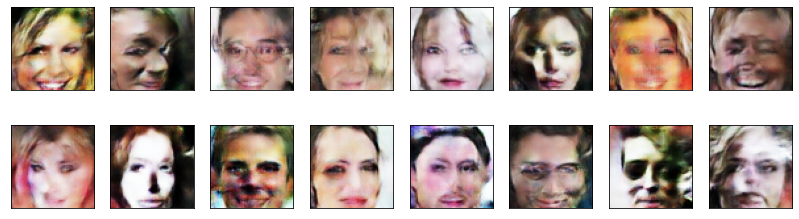

2023-08-28 11:41:09 | Epoch [23/50] | Batch 0/509 | d_loss: 0.9336 | g_loss: 7.4129
2023-08-28 11:41:10 | Epoch [23/50] | Batch 5/509 | d_loss: 1.4983 | g_loss: 0.8130
2023-08-28 11:41:11 | Epoch [23/50] | Batch 10/509 | d_loss: 0.4885 | g_loss: 2.6369
2023-08-28 11:41:12 | Epoch [23/50] | Batch 15/509 | d_loss: 0.7175 | g_loss: 4.1679
2023-08-28 11:41:13 | Epoch [23/50] | Batch 20/509 | d_loss: 0.8303 | g_loss: 5.3484
2023-08-28 11:41:14 | Epoch [23/50] | Batch 25/509 | d_loss: 0.5110 | g_loss: 4.1769
2023-08-28 11:41:15 | Epoch [23/50] | Batch 30/509 | d_loss: 0.3680 | g_loss: 4.7231
2023-08-28 11:41:16 | Epoch [23/50] | Batch 35/509 | d_loss: 0.3656 | g_loss: 4.9815
2023-08-28 11:41:17 | Epoch [23/50] | Batch 40/509 | d_loss: 0.4956 | g_loss: 5.2284
2023-08-28 11:41:18 | Epoch [23/50] | Batch 45/509 | d_loss: 0.4134 | g_loss: 3.4766
2023-08-28 11:41:20 | Epoch [23/50] | Batch 50/509 | d_loss: 0.3814 | g_loss: 3.6774
2023-08-28 11:41:21 | Epoch [23/50] | Batch 55/509 | d_loss: 0.3569

2023-08-28 11:42:48 | Epoch [23/50] | Batch 480/509 | d_loss: 0.6407 | g_loss: 4.7001
2023-08-28 11:42:49 | Epoch [23/50] | Batch 485/509 | d_loss: 0.5476 | g_loss: 4.2869
2023-08-28 11:42:50 | Epoch [23/50] | Batch 490/509 | d_loss: 0.5237 | g_loss: 3.4940
2023-08-28 11:42:51 | Epoch [23/50] | Batch 495/509 | d_loss: 0.5538 | g_loss: 3.7938
2023-08-28 11:42:52 | Epoch [23/50] | Batch 500/509 | d_loss: 0.4702 | g_loss: 3.9205
2023-08-28 11:42:53 | Epoch [23/50] | Batch 505/509 | d_loss: 0.4034 | g_loss: 4.2688


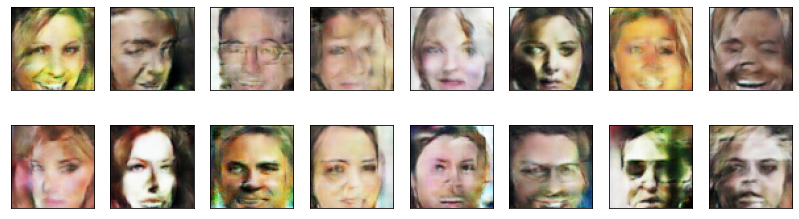

2023-08-28 11:42:58 | Epoch [24/50] | Batch 0/509 | d_loss: 0.4315 | g_loss: 3.7131
2023-08-28 11:42:59 | Epoch [24/50] | Batch 5/509 | d_loss: 0.4763 | g_loss: 3.7884
2023-08-28 11:43:00 | Epoch [24/50] | Batch 10/509 | d_loss: 0.3868 | g_loss: 4.1467
2023-08-28 11:43:01 | Epoch [24/50] | Batch 15/509 | d_loss: 0.3827 | g_loss: 3.7274
2023-08-28 11:43:02 | Epoch [24/50] | Batch 20/509 | d_loss: 0.3899 | g_loss: 3.5354
2023-08-28 11:43:03 | Epoch [24/50] | Batch 25/509 | d_loss: 0.5018 | g_loss: 3.9607
2023-08-28 11:43:04 | Epoch [24/50] | Batch 30/509 | d_loss: 0.5243 | g_loss: 2.3115
2023-08-28 11:43:05 | Epoch [24/50] | Batch 35/509 | d_loss: 0.4515 | g_loss: 3.1493
2023-08-28 11:43:06 | Epoch [24/50] | Batch 40/509 | d_loss: 0.3885 | g_loss: 2.9818
2023-08-28 11:43:07 | Epoch [24/50] | Batch 45/509 | d_loss: 0.3440 | g_loss: 6.7526
2023-08-28 11:43:08 | Epoch [24/50] | Batch 50/509 | d_loss: 0.3790 | g_loss: 3.0344
2023-08-28 11:43:09 | Epoch [24/50] | Batch 55/509 | d_loss: 0.8708

2023-08-28 11:44:38 | Epoch [24/50] | Batch 480/509 | d_loss: 0.3900 | g_loss: 3.9907
2023-08-28 11:44:39 | Epoch [24/50] | Batch 485/509 | d_loss: 0.4158 | g_loss: 3.2878
2023-08-28 11:44:40 | Epoch [24/50] | Batch 490/509 | d_loss: 0.4200 | g_loss: 3.8181
2023-08-28 11:44:41 | Epoch [24/50] | Batch 495/509 | d_loss: 0.4931 | g_loss: 3.9543
2023-08-28 11:44:42 | Epoch [24/50] | Batch 500/509 | d_loss: 0.5259 | g_loss: 3.5375
2023-08-28 11:44:43 | Epoch [24/50] | Batch 505/509 | d_loss: 0.4619 | g_loss: 3.8001


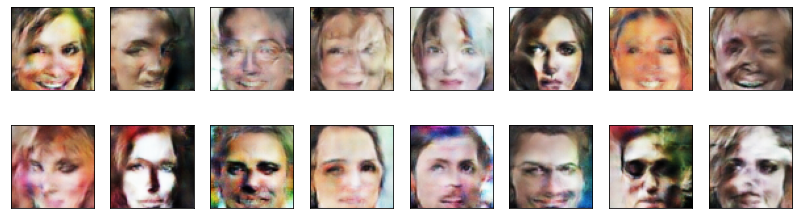

2023-08-28 11:44:49 | Epoch [25/50] | Batch 0/509 | d_loss: 0.5013 | g_loss: 4.2709
2023-08-28 11:44:50 | Epoch [25/50] | Batch 5/509 | d_loss: 0.3885 | g_loss: 4.1463
2023-08-28 11:44:51 | Epoch [25/50] | Batch 10/509 | d_loss: 0.6239 | g_loss: 4.0666
2023-08-28 11:44:52 | Epoch [25/50] | Batch 15/509 | d_loss: 0.7419 | g_loss: 2.5376
2023-08-28 11:44:53 | Epoch [25/50] | Batch 20/509 | d_loss: 0.3716 | g_loss: 4.1497
2023-08-28 11:44:54 | Epoch [25/50] | Batch 25/509 | d_loss: 0.4499 | g_loss: 3.7514
2023-08-28 11:44:55 | Epoch [25/50] | Batch 30/509 | d_loss: 0.5049 | g_loss: 4.3578
2023-08-28 11:44:56 | Epoch [25/50] | Batch 35/509 | d_loss: 0.4061 | g_loss: 3.7738
2023-08-28 11:44:57 | Epoch [25/50] | Batch 40/509 | d_loss: 0.3627 | g_loss: 4.7418
2023-08-28 11:44:58 | Epoch [25/50] | Batch 45/509 | d_loss: 0.4892 | g_loss: 4.1468
2023-08-28 11:45:00 | Epoch [25/50] | Batch 50/509 | d_loss: 0.3699 | g_loss: 5.5746
2023-08-28 11:45:01 | Epoch [25/50] | Batch 55/509 | d_loss: 0.3869

2023-08-28 11:46:29 | Epoch [25/50] | Batch 480/509 | d_loss: 0.3901 | g_loss: 3.0544
2023-08-28 11:46:30 | Epoch [25/50] | Batch 485/509 | d_loss: 0.3976 | g_loss: 2.7796
2023-08-28 11:46:31 | Epoch [25/50] | Batch 490/509 | d_loss: 0.4067 | g_loss: 3.9192
2023-08-28 11:46:32 | Epoch [25/50] | Batch 495/509 | d_loss: 0.3896 | g_loss: 3.7721
2023-08-28 11:46:33 | Epoch [25/50] | Batch 500/509 | d_loss: 0.4395 | g_loss: 3.3328
2023-08-28 11:46:34 | Epoch [25/50] | Batch 505/509 | d_loss: 0.4206 | g_loss: 3.7480


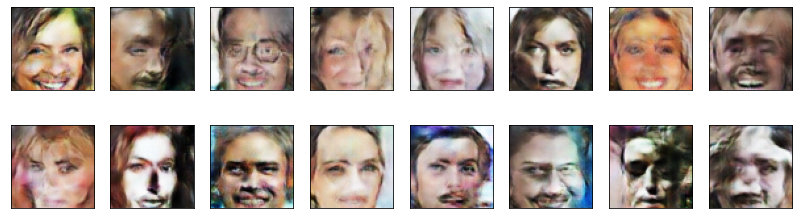

2023-08-28 11:46:39 | Epoch [26/50] | Batch 0/509 | d_loss: 0.4962 | g_loss: 4.0503
2023-08-28 11:46:41 | Epoch [26/50] | Batch 5/509 | d_loss: 0.4659 | g_loss: 3.6603
2023-08-28 11:46:42 | Epoch [26/50] | Batch 10/509 | d_loss: 0.4065 | g_loss: 3.0267
2023-08-28 11:46:43 | Epoch [26/50] | Batch 15/509 | d_loss: 0.3912 | g_loss: 2.9962
2023-08-28 11:46:44 | Epoch [26/50] | Batch 20/509 | d_loss: 0.5132 | g_loss: 4.7738
2023-08-28 11:46:45 | Epoch [26/50] | Batch 25/509 | d_loss: 0.5101 | g_loss: 4.0058
2023-08-28 11:46:46 | Epoch [26/50] | Batch 30/509 | d_loss: 0.4697 | g_loss: 2.5089
2023-08-28 11:46:47 | Epoch [26/50] | Batch 35/509 | d_loss: 0.4008 | g_loss: 3.7757
2023-08-28 11:46:48 | Epoch [26/50] | Batch 40/509 | d_loss: 0.4673 | g_loss: 3.0078
2023-08-28 11:46:49 | Epoch [26/50] | Batch 45/509 | d_loss: 0.3873 | g_loss: 4.4138
2023-08-28 11:46:50 | Epoch [26/50] | Batch 50/509 | d_loss: 0.3774 | g_loss: 3.7006
2023-08-28 11:46:51 | Epoch [26/50] | Batch 55/509 | d_loss: 0.4011

2023-08-28 11:48:19 | Epoch [26/50] | Batch 480/509 | d_loss: 0.3659 | g_loss: 6.4318
2023-08-28 11:48:20 | Epoch [26/50] | Batch 485/509 | d_loss: 0.4153 | g_loss: 3.8460
2023-08-28 11:48:21 | Epoch [26/50] | Batch 490/509 | d_loss: 0.4776 | g_loss: 3.3448
2023-08-28 11:48:22 | Epoch [26/50] | Batch 495/509 | d_loss: 0.4269 | g_loss: 3.2407
2023-08-28 11:48:23 | Epoch [26/50] | Batch 500/509 | d_loss: 0.3512 | g_loss: 7.0590
2023-08-28 11:48:24 | Epoch [26/50] | Batch 505/509 | d_loss: 0.3552 | g_loss: 4.0044


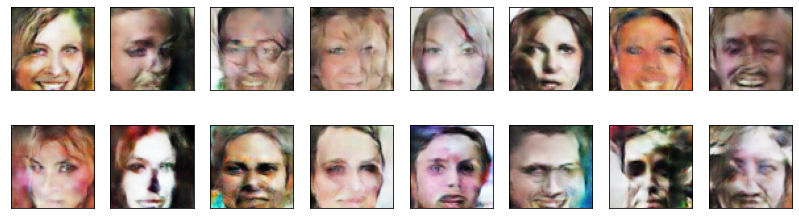

2023-08-28 11:48:28 | Epoch [27/50] | Batch 0/509 | d_loss: 0.5168 | g_loss: 2.3195
2023-08-28 11:48:29 | Epoch [27/50] | Batch 5/509 | d_loss: 0.4114 | g_loss: 4.5121
2023-08-28 11:48:30 | Epoch [27/50] | Batch 10/509 | d_loss: 0.3978 | g_loss: 5.0877
2023-08-28 11:48:31 | Epoch [27/50] | Batch 15/509 | d_loss: 0.4068 | g_loss: 3.5252
2023-08-28 11:48:33 | Epoch [27/50] | Batch 20/509 | d_loss: 0.3503 | g_loss: 4.2744
2023-08-28 11:48:34 | Epoch [27/50] | Batch 25/509 | d_loss: 0.3960 | g_loss: 3.6122
2023-08-28 11:48:35 | Epoch [27/50] | Batch 30/509 | d_loss: 0.3661 | g_loss: 5.2051
2023-08-28 11:48:36 | Epoch [27/50] | Batch 35/509 | d_loss: 0.3544 | g_loss: 4.5649
2023-08-28 11:48:37 | Epoch [27/50] | Batch 40/509 | d_loss: 0.3683 | g_loss: 7.6001
2023-08-28 11:48:38 | Epoch [27/50] | Batch 45/509 | d_loss: 0.3812 | g_loss: 4.7747
2023-08-28 11:48:39 | Epoch [27/50] | Batch 50/509 | d_loss: 0.7953 | g_loss: 1.8765
2023-08-28 11:48:40 | Epoch [27/50] | Batch 55/509 | d_loss: 0.3992

2023-08-28 11:50:09 | Epoch [27/50] | Batch 480/509 | d_loss: 0.3874 | g_loss: 4.1598
2023-08-28 11:50:10 | Epoch [27/50] | Batch 485/509 | d_loss: 0.4429 | g_loss: 3.6339
2023-08-28 11:50:11 | Epoch [27/50] | Batch 490/509 | d_loss: 0.6563 | g_loss: 4.8520
2023-08-28 11:50:12 | Epoch [27/50] | Batch 495/509 | d_loss: 0.5216 | g_loss: 3.2306
2023-08-28 11:50:13 | Epoch [27/50] | Batch 500/509 | d_loss: 0.3796 | g_loss: 3.6309
2023-08-28 11:50:14 | Epoch [27/50] | Batch 505/509 | d_loss: 0.3838 | g_loss: 4.4888


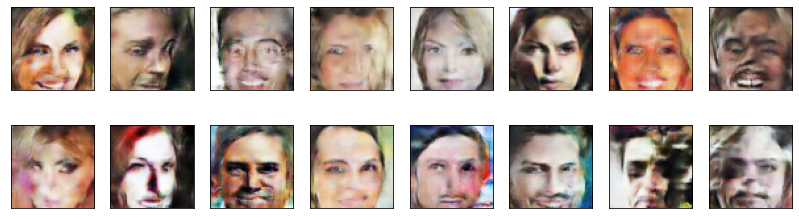

2023-08-28 11:50:19 | Epoch [28/50] | Batch 0/509 | d_loss: 0.3995 | g_loss: 3.7320
2023-08-28 11:50:20 | Epoch [28/50] | Batch 5/509 | d_loss: 0.4313 | g_loss: 5.3048
2023-08-28 11:50:21 | Epoch [28/50] | Batch 10/509 | d_loss: 0.3877 | g_loss: 5.3105
2023-08-28 11:50:22 | Epoch [28/50] | Batch 15/509 | d_loss: 0.3899 | g_loss: 3.5615
2023-08-28 11:50:23 | Epoch [28/50] | Batch 20/509 | d_loss: 0.3917 | g_loss: 3.6338
2023-08-28 11:50:24 | Epoch [28/50] | Batch 25/509 | d_loss: 0.3618 | g_loss: 4.5025
2023-08-28 11:50:25 | Epoch [28/50] | Batch 30/509 | d_loss: 0.3626 | g_loss: 4.3775
2023-08-28 11:50:26 | Epoch [28/50] | Batch 35/509 | d_loss: 0.3560 | g_loss: 5.5002
2023-08-28 11:50:28 | Epoch [28/50] | Batch 40/509 | d_loss: 0.4191 | g_loss: 3.3551
2023-08-28 11:50:29 | Epoch [28/50] | Batch 45/509 | d_loss: 0.5108 | g_loss: 4.2820
2023-08-28 11:50:30 | Epoch [28/50] | Batch 50/509 | d_loss: 0.3891 | g_loss: 3.6536
2023-08-28 11:50:31 | Epoch [28/50] | Batch 55/509 | d_loss: 0.6622

2023-08-28 11:52:01 | Epoch [28/50] | Batch 480/509 | d_loss: 0.4642 | g_loss: 4.2057
2023-08-28 11:52:02 | Epoch [28/50] | Batch 485/509 | d_loss: 0.3610 | g_loss: 6.1091
2023-08-28 11:52:03 | Epoch [28/50] | Batch 490/509 | d_loss: 0.4302 | g_loss: 4.9340
2023-08-28 11:52:04 | Epoch [28/50] | Batch 495/509 | d_loss: 0.3630 | g_loss: 5.9265
2023-08-28 11:52:05 | Epoch [28/50] | Batch 500/509 | d_loss: 0.3536 | g_loss: 7.1412
2023-08-28 11:52:06 | Epoch [28/50] | Batch 505/509 | d_loss: 0.3544 | g_loss: 4.5348


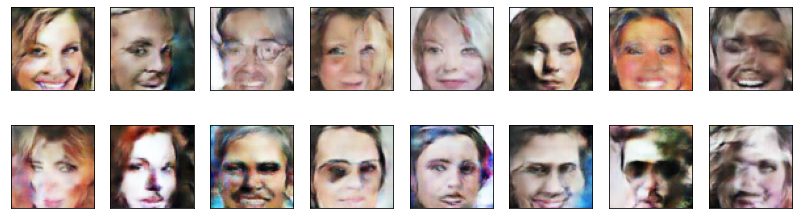

2023-08-28 11:52:11 | Epoch [29/50] | Batch 0/509 | d_loss: 0.3426 | g_loss: 7.2831
2023-08-28 11:52:12 | Epoch [29/50] | Batch 5/509 | d_loss: 0.3784 | g_loss: 3.6461
2023-08-28 11:52:13 | Epoch [29/50] | Batch 10/509 | d_loss: 0.3650 | g_loss: 4.2456
2023-08-28 11:52:14 | Epoch [29/50] | Batch 15/509 | d_loss: 0.3817 | g_loss: 5.7107
2023-08-28 11:52:15 | Epoch [29/50] | Batch 20/509 | d_loss: 0.3681 | g_loss: 3.9640
2023-08-28 11:52:16 | Epoch [29/50] | Batch 25/509 | d_loss: 0.3890 | g_loss: 5.4793
2023-08-28 11:52:17 | Epoch [29/50] | Batch 30/509 | d_loss: 0.3645 | g_loss: 4.0138
2023-08-28 11:52:18 | Epoch [29/50] | Batch 35/509 | d_loss: 0.3926 | g_loss: 4.4409
2023-08-28 11:52:19 | Epoch [29/50] | Batch 40/509 | d_loss: 0.6652 | g_loss: 3.3835
2023-08-28 11:52:20 | Epoch [29/50] | Batch 45/509 | d_loss: 0.4394 | g_loss: 3.2131
2023-08-28 11:52:21 | Epoch [29/50] | Batch 50/509 | d_loss: 0.5725 | g_loss: 2.5144
2023-08-28 11:52:22 | Epoch [29/50] | Batch 55/509 | d_loss: 0.4591

2023-08-28 11:53:52 | Epoch [29/50] | Batch 480/509 | d_loss: 0.5992 | g_loss: 4.4049
2023-08-28 11:53:53 | Epoch [29/50] | Batch 485/509 | d_loss: 0.4077 | g_loss: 4.5481
2023-08-28 11:53:54 | Epoch [29/50] | Batch 490/509 | d_loss: 0.4024 | g_loss: 3.8234
2023-08-28 11:53:55 | Epoch [29/50] | Batch 495/509 | d_loss: 0.4485 | g_loss: 3.1636
2023-08-28 11:53:56 | Epoch [29/50] | Batch 500/509 | d_loss: 1.1079 | g_loss: 2.6025
2023-08-28 11:53:57 | Epoch [29/50] | Batch 505/509 | d_loss: 0.5781 | g_loss: 4.2988


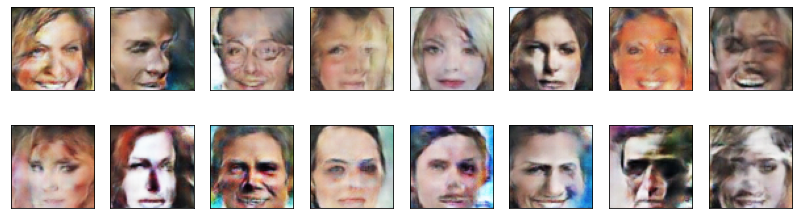

2023-08-28 11:54:01 | Epoch [30/50] | Batch 0/509 | d_loss: 0.4351 | g_loss: 3.6392
2023-08-28 11:54:02 | Epoch [30/50] | Batch 5/509 | d_loss: 0.4092 | g_loss: 2.7868
2023-08-28 11:54:03 | Epoch [30/50] | Batch 10/509 | d_loss: 0.3996 | g_loss: 6.5883
2023-08-28 11:54:05 | Epoch [30/50] | Batch 15/509 | d_loss: 0.3785 | g_loss: 4.6892
2023-08-28 11:54:06 | Epoch [30/50] | Batch 20/509 | d_loss: 0.3889 | g_loss: 4.1660
2023-08-28 11:54:07 | Epoch [30/50] | Batch 25/509 | d_loss: 0.3955 | g_loss: 4.0843
2023-08-28 11:54:08 | Epoch [30/50] | Batch 30/509 | d_loss: 0.3880 | g_loss: 3.5642
2023-08-28 11:54:09 | Epoch [30/50] | Batch 35/509 | d_loss: 0.5298 | g_loss: 3.9872
2023-08-28 11:54:10 | Epoch [30/50] | Batch 40/509 | d_loss: 0.3796 | g_loss: 3.9058
2023-08-28 11:54:11 | Epoch [30/50] | Batch 45/509 | d_loss: 0.4089 | g_loss: 3.5207
2023-08-28 11:54:12 | Epoch [30/50] | Batch 50/509 | d_loss: 0.7898 | g_loss: 2.8770
2023-08-28 11:54:13 | Epoch [30/50] | Batch 55/509 | d_loss: 0.4858

2023-08-28 11:55:41 | Epoch [30/50] | Batch 480/509 | d_loss: 0.4355 | g_loss: 4.2314
2023-08-28 11:55:42 | Epoch [30/50] | Batch 485/509 | d_loss: 0.4155 | g_loss: 4.0605
2023-08-28 11:55:43 | Epoch [30/50] | Batch 490/509 | d_loss: 0.3720 | g_loss: 4.4315
2023-08-28 11:55:44 | Epoch [30/50] | Batch 495/509 | d_loss: 0.5584 | g_loss: 4.6227
2023-08-28 11:55:45 | Epoch [30/50] | Batch 500/509 | d_loss: 0.3519 | g_loss: 6.2070
2023-08-28 11:55:46 | Epoch [30/50] | Batch 505/509 | d_loss: 0.4394 | g_loss: 2.9328


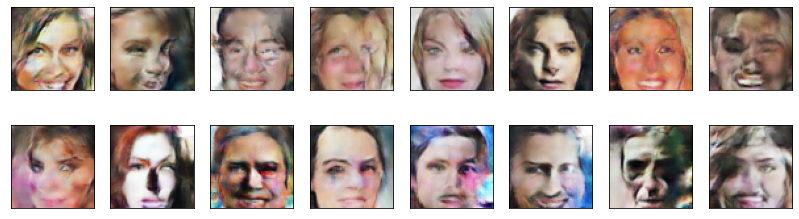

2023-08-28 11:55:51 | Epoch [31/50] | Batch 0/509 | d_loss: 0.3573 | g_loss: 5.6155
2023-08-28 11:55:53 | Epoch [31/50] | Batch 5/509 | d_loss: 0.4409 | g_loss: 3.4917
2023-08-28 11:55:54 | Epoch [31/50] | Batch 10/509 | d_loss: 0.4292 | g_loss: 3.2227
2023-08-28 11:55:55 | Epoch [31/50] | Batch 15/509 | d_loss: 0.4257 | g_loss: 4.4931
2023-08-28 11:55:56 | Epoch [31/50] | Batch 20/509 | d_loss: 0.3751 | g_loss: 3.6629
2023-08-28 11:55:57 | Epoch [31/50] | Batch 25/509 | d_loss: 0.3763 | g_loss: 4.7508
2023-08-28 11:55:58 | Epoch [31/50] | Batch 30/509 | d_loss: 0.3746 | g_loss: 4.9573
2023-08-28 11:55:59 | Epoch [31/50] | Batch 35/509 | d_loss: 0.3549 | g_loss: 4.0658
2023-08-28 11:56:01 | Epoch [31/50] | Batch 40/509 | d_loss: 0.4375 | g_loss: 3.9548
2023-08-28 11:56:02 | Epoch [31/50] | Batch 45/509 | d_loss: 0.3557 | g_loss: 5.7321
2023-08-28 11:56:03 | Epoch [31/50] | Batch 50/509 | d_loss: 0.4061 | g_loss: 2.8038
2023-08-28 11:56:03 | Epoch [31/50] | Batch 55/509 | d_loss: 0.3606

2023-08-28 11:57:34 | Epoch [31/50] | Batch 480/509 | d_loss: 0.4300 | g_loss: 5.7992
2023-08-28 11:57:35 | Epoch [31/50] | Batch 485/509 | d_loss: 0.3998 | g_loss: 4.2381
2023-08-28 11:57:36 | Epoch [31/50] | Batch 490/509 | d_loss: 0.4506 | g_loss: 3.3548
2023-08-28 11:57:37 | Epoch [31/50] | Batch 495/509 | d_loss: 0.3637 | g_loss: 4.7764
2023-08-28 11:57:38 | Epoch [31/50] | Batch 500/509 | d_loss: 0.3612 | g_loss: 3.7823
2023-08-28 11:57:39 | Epoch [31/50] | Batch 505/509 | d_loss: 0.4843 | g_loss: 4.3778


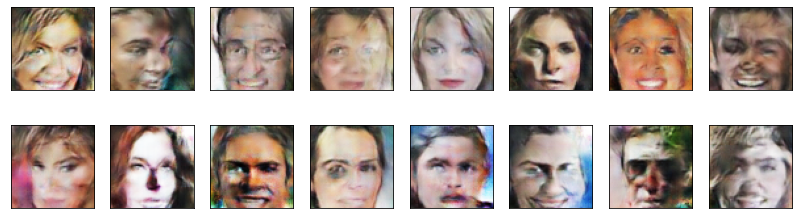

2023-08-28 11:57:44 | Epoch [32/50] | Batch 0/509 | d_loss: 0.3639 | g_loss: 4.6040
2023-08-28 11:57:45 | Epoch [32/50] | Batch 5/509 | d_loss: 0.4286 | g_loss: 4.3382
2023-08-28 11:57:46 | Epoch [32/50] | Batch 10/509 | d_loss: 0.3552 | g_loss: 4.5131
2023-08-28 11:57:47 | Epoch [32/50] | Batch 15/509 | d_loss: 0.6857 | g_loss: 4.1425
2023-08-28 11:57:48 | Epoch [32/50] | Batch 20/509 | d_loss: 0.4889 | g_loss: 5.2327
2023-08-28 11:57:49 | Epoch [32/50] | Batch 25/509 | d_loss: 0.9692 | g_loss: 6.1572
2023-08-28 11:57:51 | Epoch [32/50] | Batch 30/509 | d_loss: 0.5200 | g_loss: 3.4102
2023-08-28 11:57:52 | Epoch [32/50] | Batch 35/509 | d_loss: 0.3728 | g_loss: 3.9777
2023-08-28 11:57:53 | Epoch [32/50] | Batch 40/509 | d_loss: 0.3709 | g_loss: 4.4469
2023-08-28 11:57:54 | Epoch [32/50] | Batch 45/509 | d_loss: 0.3480 | g_loss: 5.9310
2023-08-28 11:57:55 | Epoch [32/50] | Batch 50/509 | d_loss: 0.5051 | g_loss: 5.5104
2023-08-28 11:57:56 | Epoch [32/50] | Batch 55/509 | d_loss: 0.3521

2023-08-28 11:59:25 | Epoch [32/50] | Batch 480/509 | d_loss: 0.3618 | g_loss: 5.0498
2023-08-28 11:59:26 | Epoch [32/50] | Batch 485/509 | d_loss: 0.3738 | g_loss: 4.3153
2023-08-28 11:59:27 | Epoch [32/50] | Batch 490/509 | d_loss: 0.3923 | g_loss: 7.4458
2023-08-28 11:59:28 | Epoch [32/50] | Batch 495/509 | d_loss: 0.3452 | g_loss: 4.2527
2023-08-28 11:59:29 | Epoch [32/50] | Batch 500/509 | d_loss: 0.5035 | g_loss: 7.6223
2023-08-28 11:59:30 | Epoch [32/50] | Batch 505/509 | d_loss: 0.3477 | g_loss: 7.5122


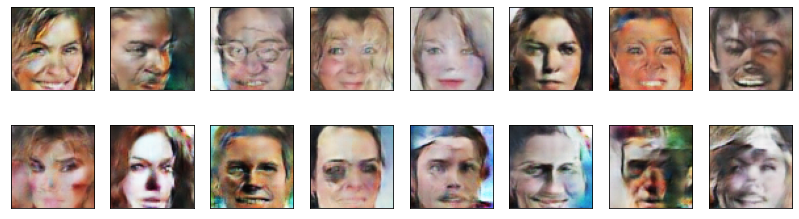

2023-08-28 11:59:34 | Epoch [33/50] | Batch 0/509 | d_loss: 0.4660 | g_loss: 5.9997
2023-08-28 11:59:35 | Epoch [33/50] | Batch 5/509 | d_loss: 0.3474 | g_loss: 5.0107
2023-08-28 11:59:36 | Epoch [33/50] | Batch 10/509 | d_loss: 0.4392 | g_loss: 4.5716
2023-08-28 11:59:37 | Epoch [33/50] | Batch 15/509 | d_loss: 1.2433 | g_loss: 0.9486
2023-08-28 11:59:38 | Epoch [33/50] | Batch 20/509 | d_loss: 0.9323 | g_loss: 4.1078
2023-08-28 11:59:39 | Epoch [33/50] | Batch 25/509 | d_loss: 0.7047 | g_loss: 1.9099
2023-08-28 11:59:40 | Epoch [33/50] | Batch 30/509 | d_loss: 0.4080 | g_loss: 3.8004
2023-08-28 11:59:41 | Epoch [33/50] | Batch 35/509 | d_loss: 0.4377 | g_loss: 3.7972
2023-08-28 11:59:42 | Epoch [33/50] | Batch 40/509 | d_loss: 0.4824 | g_loss: 3.7825
2023-08-28 11:59:43 | Epoch [33/50] | Batch 45/509 | d_loss: 0.3755 | g_loss: 4.6505
2023-08-28 11:59:44 | Epoch [33/50] | Batch 50/509 | d_loss: 0.3763 | g_loss: 4.1672
2023-08-28 11:59:45 | Epoch [33/50] | Batch 55/509 | d_loss: 0.9572

2023-08-28 12:01:14 | Epoch [33/50] | Batch 480/509 | d_loss: 0.4405 | g_loss: 2.9019
2023-08-28 12:01:15 | Epoch [33/50] | Batch 485/509 | d_loss: 0.4604 | g_loss: 2.0950
2023-08-28 12:01:16 | Epoch [33/50] | Batch 490/509 | d_loss: 0.3796 | g_loss: 4.7176
2023-08-28 12:01:17 | Epoch [33/50] | Batch 495/509 | d_loss: 0.4154 | g_loss: 3.9234
2023-08-28 12:01:18 | Epoch [33/50] | Batch 500/509 | d_loss: 0.5723 | g_loss: 4.4665
2023-08-28 12:01:19 | Epoch [33/50] | Batch 505/509 | d_loss: 0.4369 | g_loss: 3.6709


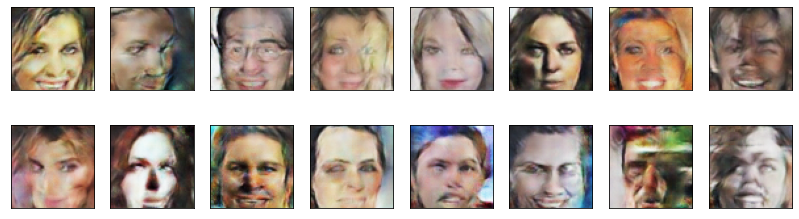

2023-08-28 12:01:24 | Epoch [34/50] | Batch 0/509 | d_loss: 0.3677 | g_loss: 4.2660
2023-08-28 12:01:25 | Epoch [34/50] | Batch 5/509 | d_loss: 0.4161 | g_loss: 4.2213
2023-08-28 12:01:26 | Epoch [34/50] | Batch 10/509 | d_loss: 0.4043 | g_loss: 3.5341
2023-08-28 12:01:27 | Epoch [34/50] | Batch 15/509 | d_loss: 0.3958 | g_loss: 4.4369
2023-08-28 12:01:28 | Epoch [34/50] | Batch 20/509 | d_loss: 0.5591 | g_loss: 5.1869
2023-08-28 12:01:29 | Epoch [34/50] | Batch 25/509 | d_loss: 0.4062 | g_loss: 3.8838
2023-08-28 12:01:30 | Epoch [34/50] | Batch 30/509 | d_loss: 0.3667 | g_loss: 5.3408
2023-08-28 12:01:31 | Epoch [34/50] | Batch 35/509 | d_loss: 0.3872 | g_loss: 4.2229
2023-08-28 12:01:32 | Epoch [34/50] | Batch 40/509 | d_loss: 0.4367 | g_loss: 3.0725
2023-08-28 12:01:33 | Epoch [34/50] | Batch 45/509 | d_loss: 0.3868 | g_loss: 4.4541
2023-08-28 12:01:34 | Epoch [34/50] | Batch 50/509 | d_loss: 0.3793 | g_loss: 3.6613
2023-08-28 12:01:35 | Epoch [34/50] | Batch 55/509 | d_loss: 0.3846

2023-08-28 12:03:04 | Epoch [34/50] | Batch 480/509 | d_loss: 0.5292 | g_loss: 5.0165
2023-08-28 12:03:05 | Epoch [34/50] | Batch 485/509 | d_loss: 0.3832 | g_loss: 5.0381
2023-08-28 12:03:06 | Epoch [34/50] | Batch 490/509 | d_loss: 0.3482 | g_loss: 5.4095
2023-08-28 12:03:07 | Epoch [34/50] | Batch 495/509 | d_loss: 0.3592 | g_loss: 5.6955
2023-08-28 12:03:08 | Epoch [34/50] | Batch 500/509 | d_loss: 0.4057 | g_loss: 5.9823
2023-08-28 12:03:09 | Epoch [34/50] | Batch 505/509 | d_loss: 0.3526 | g_loss: 5.7067


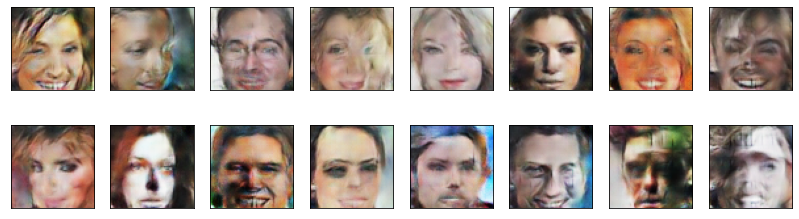

2023-08-28 12:03:13 | Epoch [35/50] | Batch 0/509 | d_loss: 0.3837 | g_loss: 4.6370
2023-08-28 12:03:15 | Epoch [35/50] | Batch 5/509 | d_loss: 0.3729 | g_loss: 4.6062
2023-08-28 12:03:16 | Epoch [35/50] | Batch 10/509 | d_loss: 0.3872 | g_loss: 3.9930
2023-08-28 12:03:17 | Epoch [35/50] | Batch 15/509 | d_loss: 1.5300 | g_loss: 0.5365
2023-08-28 12:03:18 | Epoch [35/50] | Batch 20/509 | d_loss: 0.4431 | g_loss: 5.5818
2023-08-28 12:03:19 | Epoch [35/50] | Batch 25/509 | d_loss: 0.4502 | g_loss: 3.7705
2023-08-28 12:03:20 | Epoch [35/50] | Batch 30/509 | d_loss: 0.3976 | g_loss: 4.3760
2023-08-28 12:03:21 | Epoch [35/50] | Batch 35/509 | d_loss: 0.4849 | g_loss: 2.7499
2023-08-28 12:03:22 | Epoch [35/50] | Batch 40/509 | d_loss: 0.4473 | g_loss: 3.4801
2023-08-28 12:03:23 | Epoch [35/50] | Batch 45/509 | d_loss: 0.3999 | g_loss: 4.2854
2023-08-28 12:03:24 | Epoch [35/50] | Batch 50/509 | d_loss: 0.8967 | g_loss: 6.9396
2023-08-28 12:03:25 | Epoch [35/50] | Batch 55/509 | d_loss: 0.7268

2023-08-28 12:04:53 | Epoch [35/50] | Batch 480/509 | d_loss: 1.9789 | g_loss: 2.1867
2023-08-28 12:04:54 | Epoch [35/50] | Batch 485/509 | d_loss: 1.9552 | g_loss: 2.2847
2023-08-28 12:04:55 | Epoch [35/50] | Batch 490/509 | d_loss: 0.4463 | g_loss: 2.9214
2023-08-28 12:04:56 | Epoch [35/50] | Batch 495/509 | d_loss: 0.5183 | g_loss: 2.0640
2023-08-28 12:04:57 | Epoch [35/50] | Batch 500/509 | d_loss: 0.5419 | g_loss: 4.3419
2023-08-28 12:04:58 | Epoch [35/50] | Batch 505/509 | d_loss: 0.5010 | g_loss: 2.8489


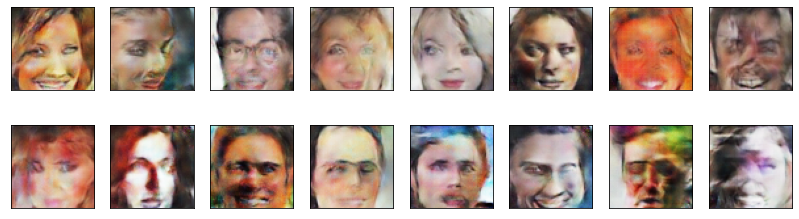

2023-08-28 12:05:02 | Epoch [36/50] | Batch 0/509 | d_loss: 0.3785 | g_loss: 4.0001
2023-08-28 12:05:04 | Epoch [36/50] | Batch 5/509 | d_loss: 0.4830 | g_loss: 4.4988
2023-08-28 12:05:05 | Epoch [36/50] | Batch 10/509 | d_loss: 0.3806 | g_loss: 4.8903
2023-08-28 12:05:06 | Epoch [36/50] | Batch 15/509 | d_loss: 0.4566 | g_loss: 4.9148
2023-08-28 12:05:07 | Epoch [36/50] | Batch 20/509 | d_loss: 0.3770 | g_loss: 3.6340
2023-08-28 12:05:08 | Epoch [36/50] | Batch 25/509 | d_loss: 0.4511 | g_loss: 2.9120
2023-08-28 12:05:09 | Epoch [36/50] | Batch 30/509 | d_loss: 0.4438 | g_loss: 3.9591
2023-08-28 12:05:10 | Epoch [36/50] | Batch 35/509 | d_loss: 0.3860 | g_loss: 3.6545
2023-08-28 12:05:11 | Epoch [36/50] | Batch 40/509 | d_loss: 0.3798 | g_loss: 4.4297
2023-08-28 12:05:12 | Epoch [36/50] | Batch 45/509 | d_loss: 0.3568 | g_loss: 4.7810
2023-08-28 12:05:13 | Epoch [36/50] | Batch 50/509 | d_loss: 0.4373 | g_loss: 2.4247
2023-08-28 12:05:14 | Epoch [36/50] | Batch 55/509 | d_loss: 0.6377

2023-08-28 12:06:41 | Epoch [36/50] | Batch 480/509 | d_loss: 0.4394 | g_loss: 4.2009
2023-08-28 12:06:42 | Epoch [36/50] | Batch 485/509 | d_loss: 0.4395 | g_loss: 4.8649
2023-08-28 12:06:43 | Epoch [36/50] | Batch 490/509 | d_loss: 0.3918 | g_loss: 4.8284
2023-08-28 12:06:44 | Epoch [36/50] | Batch 495/509 | d_loss: 0.3490 | g_loss: 5.2064
2023-08-28 12:06:45 | Epoch [36/50] | Batch 500/509 | d_loss: 0.4163 | g_loss: 4.6590
2023-08-28 12:06:46 | Epoch [36/50] | Batch 505/509 | d_loss: 0.4286 | g_loss: 4.0737


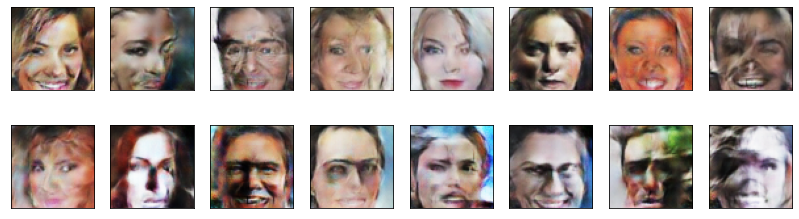

2023-08-28 12:06:51 | Epoch [37/50] | Batch 0/509 | d_loss: 0.5342 | g_loss: 4.1875
2023-08-28 12:06:52 | Epoch [37/50] | Batch 5/509 | d_loss: 0.3650 | g_loss: 4.6813
2023-08-28 12:06:53 | Epoch [37/50] | Batch 10/509 | d_loss: 0.4733 | g_loss: 4.0249
2023-08-28 12:06:54 | Epoch [37/50] | Batch 15/509 | d_loss: 0.3624 | g_loss: 4.5397
2023-08-28 12:06:55 | Epoch [37/50] | Batch 20/509 | d_loss: 0.3994 | g_loss: 3.0038
2023-08-28 12:06:57 | Epoch [37/50] | Batch 25/509 | d_loss: 0.3862 | g_loss: 4.2191
2023-08-28 12:06:58 | Epoch [37/50] | Batch 30/509 | d_loss: 0.4997 | g_loss: 4.2393
2023-08-28 12:06:59 | Epoch [37/50] | Batch 35/509 | d_loss: 0.3419 | g_loss: 6.3217
2023-08-28 12:07:00 | Epoch [37/50] | Batch 40/509 | d_loss: 0.3913 | g_loss: 4.1395
2023-08-28 12:07:01 | Epoch [37/50] | Batch 45/509 | d_loss: 0.3735 | g_loss: 4.7251
2023-08-28 12:07:02 | Epoch [37/50] | Batch 50/509 | d_loss: 0.3454 | g_loss: 6.9991
2023-08-28 12:07:03 | Epoch [37/50] | Batch 55/509 | d_loss: 0.3610

2023-08-28 12:08:31 | Epoch [37/50] | Batch 480/509 | d_loss: 0.4304 | g_loss: 3.3927
2023-08-28 12:08:32 | Epoch [37/50] | Batch 485/509 | d_loss: 0.4208 | g_loss: 2.8271
2023-08-28 12:08:33 | Epoch [37/50] | Batch 490/509 | d_loss: 1.7374 | g_loss: 6.3852
2023-08-28 12:08:34 | Epoch [37/50] | Batch 495/509 | d_loss: 0.4928 | g_loss: 3.3759
2023-08-28 12:08:35 | Epoch [37/50] | Batch 500/509 | d_loss: 0.4782 | g_loss: 4.0674
2023-08-28 12:08:36 | Epoch [37/50] | Batch 505/509 | d_loss: 0.4356 | g_loss: 3.3755


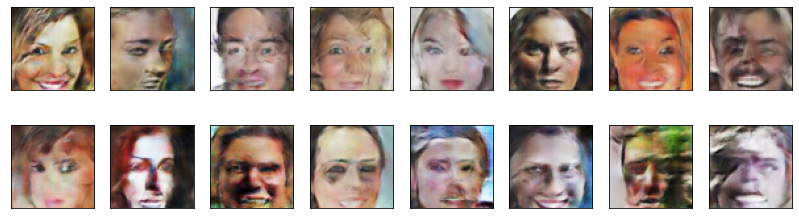

2023-08-28 12:08:41 | Epoch [38/50] | Batch 0/509 | d_loss: 0.3838 | g_loss: 3.9287
2023-08-28 12:08:42 | Epoch [38/50] | Batch 5/509 | d_loss: 0.4108 | g_loss: 3.4039
2023-08-28 12:08:43 | Epoch [38/50] | Batch 10/509 | d_loss: 0.5043 | g_loss: 2.9894
2023-08-28 12:08:44 | Epoch [38/50] | Batch 15/509 | d_loss: 0.4042 | g_loss: 4.9784
2023-08-28 12:08:45 | Epoch [38/50] | Batch 20/509 | d_loss: 0.5641 | g_loss: 3.4450
2023-08-28 12:08:46 | Epoch [38/50] | Batch 25/509 | d_loss: 0.5123 | g_loss: 3.1204
2023-08-28 12:08:47 | Epoch [38/50] | Batch 30/509 | d_loss: 0.4386 | g_loss: 3.4550
2023-08-28 12:08:48 | Epoch [38/50] | Batch 35/509 | d_loss: 0.4297 | g_loss: 3.3696
2023-08-28 12:08:49 | Epoch [38/50] | Batch 40/509 | d_loss: 0.6993 | g_loss: 6.8594
2023-08-28 12:08:50 | Epoch [38/50] | Batch 45/509 | d_loss: 0.9938 | g_loss: 6.6805
2023-08-28 12:08:51 | Epoch [38/50] | Batch 50/509 | d_loss: 0.4074 | g_loss: 4.3001
2023-08-28 12:08:52 | Epoch [38/50] | Batch 55/509 | d_loss: 0.4325

2023-08-28 12:10:20 | Epoch [38/50] | Batch 480/509 | d_loss: 0.6295 | g_loss: 3.6113
2023-08-28 12:10:21 | Epoch [38/50] | Batch 485/509 | d_loss: 4.3686 | g_loss: 7.6662
2023-08-28 12:10:22 | Epoch [38/50] | Batch 490/509 | d_loss: 0.5646 | g_loss: 2.9818
2023-08-28 12:10:23 | Epoch [38/50] | Batch 495/509 | d_loss: 0.5543 | g_loss: 3.9731
2023-08-28 12:10:24 | Epoch [38/50] | Batch 500/509 | d_loss: 0.4862 | g_loss: 3.0193
2023-08-28 12:10:25 | Epoch [38/50] | Batch 505/509 | d_loss: 0.5625 | g_loss: 1.8176


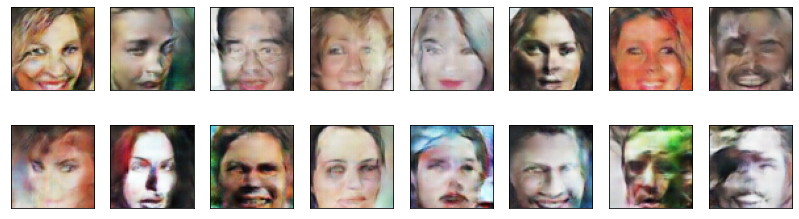

2023-08-28 12:10:28 | Epoch [39/50] | Batch 0/509 | d_loss: 0.7340 | g_loss: 4.1804
2023-08-28 12:10:30 | Epoch [39/50] | Batch 5/509 | d_loss: 0.4931 | g_loss: 3.5586
2023-08-28 12:10:31 | Epoch [39/50] | Batch 10/509 | d_loss: 0.5061 | g_loss: 2.4435
2023-08-28 12:10:32 | Epoch [39/50] | Batch 15/509 | d_loss: 0.3855 | g_loss: 3.7450
2023-08-28 12:10:33 | Epoch [39/50] | Batch 20/509 | d_loss: 0.5139 | g_loss: 2.0667
2023-08-28 12:10:34 | Epoch [39/50] | Batch 25/509 | d_loss: 0.4767 | g_loss: 4.9263
2023-08-28 12:10:35 | Epoch [39/50] | Batch 30/509 | d_loss: 0.3822 | g_loss: 5.9242
2023-08-28 12:10:36 | Epoch [39/50] | Batch 35/509 | d_loss: 0.4213 | g_loss: 4.1114
2023-08-28 12:10:37 | Epoch [39/50] | Batch 40/509 | d_loss: 0.3869 | g_loss: 3.8774
2023-08-28 12:10:38 | Epoch [39/50] | Batch 45/509 | d_loss: 0.3660 | g_loss: 4.5939
2023-08-28 12:10:39 | Epoch [39/50] | Batch 50/509 | d_loss: 0.3841 | g_loss: 3.5018
2023-08-28 12:10:40 | Epoch [39/50] | Batch 55/509 | d_loss: 0.4586

2023-08-28 12:12:09 | Epoch [39/50] | Batch 480/509 | d_loss: 0.3592 | g_loss: 5.5443
2023-08-28 12:12:10 | Epoch [39/50] | Batch 485/509 | d_loss: 0.3539 | g_loss: 6.3880
2023-08-28 12:12:11 | Epoch [39/50] | Batch 490/509 | d_loss: 0.3676 | g_loss: 4.3802
2023-08-28 12:12:12 | Epoch [39/50] | Batch 495/509 | d_loss: 0.3650 | g_loss: 4.7407
2023-08-28 12:12:13 | Epoch [39/50] | Batch 500/509 | d_loss: 0.3633 | g_loss: 4.4020
2023-08-28 12:12:14 | Epoch [39/50] | Batch 505/509 | d_loss: 0.6680 | g_loss: 4.9021


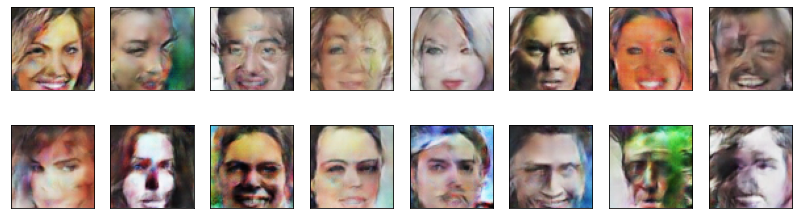

2023-08-28 12:12:18 | Epoch [40/50] | Batch 0/509 | d_loss: 0.6428 | g_loss: 5.8730
2023-08-28 12:12:19 | Epoch [40/50] | Batch 5/509 | d_loss: 0.3919 | g_loss: 4.2646
2023-08-28 12:12:20 | Epoch [40/50] | Batch 10/509 | d_loss: 0.3937 | g_loss: 3.7984
2023-08-28 12:12:22 | Epoch [40/50] | Batch 15/509 | d_loss: 0.3685 | g_loss: 4.5759
2023-08-28 12:12:23 | Epoch [40/50] | Batch 20/509 | d_loss: 0.4994 | g_loss: 4.1519
2023-08-28 12:12:24 | Epoch [40/50] | Batch 25/509 | d_loss: 0.3580 | g_loss: 5.3053
2023-08-28 12:12:25 | Epoch [40/50] | Batch 30/509 | d_loss: 0.4315 | g_loss: 2.6964
2023-08-28 12:12:26 | Epoch [40/50] | Batch 35/509 | d_loss: 0.3633 | g_loss: 3.9241
2023-08-28 12:12:27 | Epoch [40/50] | Batch 40/509 | d_loss: 0.3850 | g_loss: 5.3836
2023-08-28 12:12:28 | Epoch [40/50] | Batch 45/509 | d_loss: 0.3775 | g_loss: 3.0640
2023-08-28 12:12:29 | Epoch [40/50] | Batch 50/509 | d_loss: 0.4990 | g_loss: 4.4304
2023-08-28 12:12:30 | Epoch [40/50] | Batch 55/509 | d_loss: 0.3539

2023-08-28 12:13:58 | Epoch [40/50] | Batch 480/509 | d_loss: 0.4824 | g_loss: 3.5875
2023-08-28 12:13:59 | Epoch [40/50] | Batch 485/509 | d_loss: 0.4421 | g_loss: 2.9521
2023-08-28 12:14:00 | Epoch [40/50] | Batch 490/509 | d_loss: 0.4643 | g_loss: 2.6767
2023-08-28 12:14:01 | Epoch [40/50] | Batch 495/509 | d_loss: 0.4482 | g_loss: 5.1187
2023-08-28 12:14:02 | Epoch [40/50] | Batch 500/509 | d_loss: 0.4516 | g_loss: 2.8640
2023-08-28 12:14:03 | Epoch [40/50] | Batch 505/509 | d_loss: 0.3744 | g_loss: 4.7862


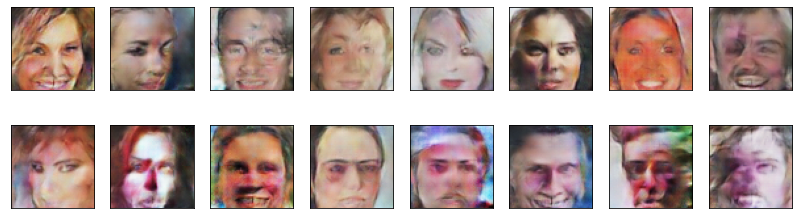

2023-08-28 12:14:07 | Epoch [41/50] | Batch 0/509 | d_loss: 0.4736 | g_loss: 2.8492
2023-08-28 12:14:08 | Epoch [41/50] | Batch 5/509 | d_loss: 0.4742 | g_loss: 3.4845
2023-08-28 12:14:09 | Epoch [41/50] | Batch 10/509 | d_loss: 0.5724 | g_loss: 3.9559
2023-08-28 12:14:10 | Epoch [41/50] | Batch 15/509 | d_loss: 0.4368 | g_loss: 3.9877
2023-08-28 12:14:11 | Epoch [41/50] | Batch 20/509 | d_loss: 0.4163 | g_loss: 3.7333
2023-08-28 12:14:12 | Epoch [41/50] | Batch 25/509 | d_loss: 0.4328 | g_loss: 3.4630
2023-08-28 12:14:13 | Epoch [41/50] | Batch 30/509 | d_loss: 0.3768 | g_loss: 3.1609
2023-08-28 12:14:14 | Epoch [41/50] | Batch 35/509 | d_loss: 0.3947 | g_loss: 3.9836
2023-08-28 12:14:15 | Epoch [41/50] | Batch 40/509 | d_loss: 0.3714 | g_loss: 6.3321
2023-08-28 12:14:16 | Epoch [41/50] | Batch 45/509 | d_loss: 0.4546 | g_loss: 4.3619
2023-08-28 12:14:17 | Epoch [41/50] | Batch 50/509 | d_loss: 0.3910 | g_loss: 4.1697
2023-08-28 12:14:18 | Epoch [41/50] | Batch 55/509 | d_loss: 0.3944

2023-08-28 12:15:47 | Epoch [41/50] | Batch 480/509 | d_loss: 0.5274 | g_loss: 2.8542
2023-08-28 12:15:48 | Epoch [41/50] | Batch 485/509 | d_loss: 0.5597 | g_loss: 2.1345
2023-08-28 12:15:49 | Epoch [41/50] | Batch 490/509 | d_loss: 0.5082 | g_loss: 3.8518
2023-08-28 12:15:50 | Epoch [41/50] | Batch 495/509 | d_loss: 0.5496 | g_loss: 2.9024
2023-08-28 12:15:51 | Epoch [41/50] | Batch 500/509 | d_loss: 0.6737 | g_loss: 1.7949
2023-08-28 12:15:52 | Epoch [41/50] | Batch 505/509 | d_loss: 0.4374 | g_loss: 3.2159


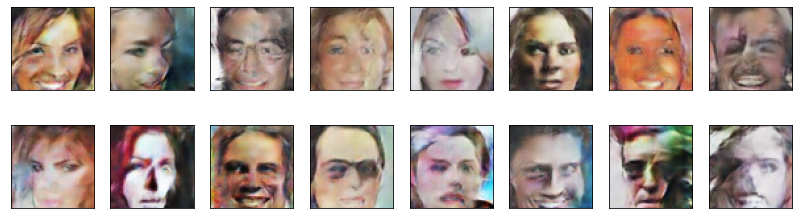

2023-08-28 12:15:57 | Epoch [42/50] | Batch 0/509 | d_loss: 0.4123 | g_loss: 3.6834
2023-08-28 12:15:58 | Epoch [42/50] | Batch 5/509 | d_loss: 0.5037 | g_loss: 3.5203
2023-08-28 12:15:59 | Epoch [42/50] | Batch 10/509 | d_loss: 0.4418 | g_loss: 3.8532
2023-08-28 12:16:00 | Epoch [42/50] | Batch 15/509 | d_loss: 0.7656 | g_loss: 2.7158
2023-08-28 12:16:01 | Epoch [42/50] | Batch 20/509 | d_loss: 0.3842 | g_loss: 4.3430
2023-08-28 12:16:03 | Epoch [42/50] | Batch 25/509 | d_loss: 0.5008 | g_loss: 3.0205
2023-08-28 12:16:04 | Epoch [42/50] | Batch 30/509 | d_loss: 0.3946 | g_loss: 3.1459
2023-08-28 12:16:05 | Epoch [42/50] | Batch 35/509 | d_loss: 0.4482 | g_loss: 3.3575
2023-08-28 12:16:06 | Epoch [42/50] | Batch 40/509 | d_loss: 0.4296 | g_loss: 3.1027
2023-08-28 12:16:07 | Epoch [42/50] | Batch 45/509 | d_loss: 0.4411 | g_loss: 3.3734
2023-08-28 12:16:08 | Epoch [42/50] | Batch 50/509 | d_loss: 0.3713 | g_loss: 4.6897
2023-08-28 12:16:09 | Epoch [42/50] | Batch 55/509 | d_loss: 0.3715

2023-08-28 12:17:38 | Epoch [42/50] | Batch 480/509 | d_loss: 0.3799 | g_loss: 4.6116
2023-08-28 12:17:39 | Epoch [42/50] | Batch 485/509 | d_loss: 0.4179 | g_loss: 3.3663
2023-08-28 12:17:40 | Epoch [42/50] | Batch 490/509 | d_loss: 0.4075 | g_loss: 3.6819
2023-08-28 12:17:41 | Epoch [42/50] | Batch 495/509 | d_loss: 0.3617 | g_loss: 4.2285
2023-08-28 12:17:42 | Epoch [42/50] | Batch 500/509 | d_loss: 0.4096 | g_loss: 2.7474
2023-08-28 12:17:43 | Epoch [42/50] | Batch 505/509 | d_loss: 0.3567 | g_loss: 4.8749


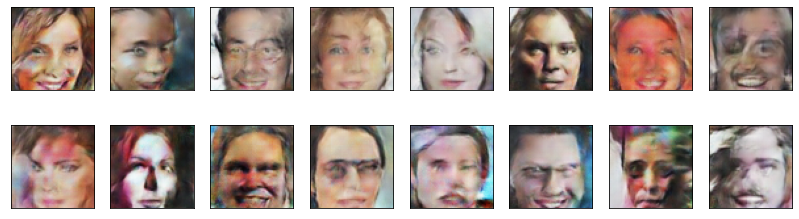

2023-08-28 12:17:49 | Epoch [43/50] | Batch 0/509 | d_loss: 0.4113 | g_loss: 4.1402
2023-08-28 12:17:50 | Epoch [43/50] | Batch 5/509 | d_loss: 0.3608 | g_loss: 3.9728
2023-08-28 12:17:52 | Epoch [43/50] | Batch 10/509 | d_loss: 0.3681 | g_loss: 5.0330
2023-08-28 12:17:53 | Epoch [43/50] | Batch 15/509 | d_loss: 0.4406 | g_loss: 2.9313
2023-08-28 12:17:54 | Epoch [43/50] | Batch 20/509 | d_loss: 0.3987 | g_loss: 4.4106
2023-08-28 12:17:55 | Epoch [43/50] | Batch 25/509 | d_loss: 0.4371 | g_loss: 3.8742
2023-08-28 12:17:56 | Epoch [43/50] | Batch 30/509 | d_loss: 0.4214 | g_loss: 4.0884
2023-08-28 12:17:57 | Epoch [43/50] | Batch 35/509 | d_loss: 0.3981 | g_loss: 2.8760
2023-08-28 12:17:58 | Epoch [43/50] | Batch 40/509 | d_loss: 0.3820 | g_loss: 3.6015
2023-08-28 12:17:59 | Epoch [43/50] | Batch 45/509 | d_loss: 0.3800 | g_loss: 4.0008
2023-08-28 12:18:00 | Epoch [43/50] | Batch 50/509 | d_loss: 0.3503 | g_loss: 5.0108
2023-08-28 12:18:01 | Epoch [43/50] | Batch 55/509 | d_loss: 0.4064

2023-08-28 12:19:30 | Epoch [43/50] | Batch 480/509 | d_loss: 0.6260 | g_loss: 3.8381
2023-08-28 12:19:31 | Epoch [43/50] | Batch 485/509 | d_loss: 0.4477 | g_loss: 3.0254
2023-08-28 12:19:32 | Epoch [43/50] | Batch 490/509 | d_loss: 0.6195 | g_loss: 4.1314
2023-08-28 12:19:33 | Epoch [43/50] | Batch 495/509 | d_loss: 0.4188 | g_loss: 3.5726
2023-08-28 12:19:34 | Epoch [43/50] | Batch 500/509 | d_loss: 0.3791 | g_loss: 4.3074
2023-08-28 12:19:35 | Epoch [43/50] | Batch 505/509 | d_loss: 0.4138 | g_loss: 4.2192


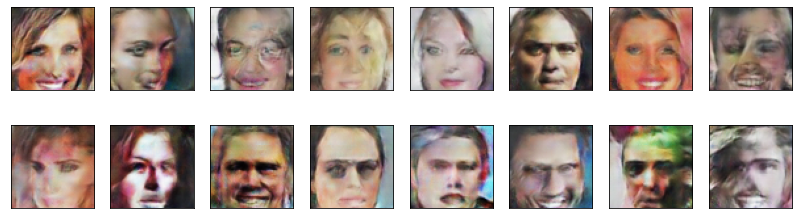

2023-08-28 12:19:39 | Epoch [44/50] | Batch 0/509 | d_loss: 0.3943 | g_loss: 3.7919
2023-08-28 12:19:40 | Epoch [44/50] | Batch 5/509 | d_loss: 0.3822 | g_loss: 4.7618
2023-08-28 12:19:42 | Epoch [44/50] | Batch 10/509 | d_loss: 0.6160 | g_loss: 5.2871
2023-08-28 12:19:43 | Epoch [44/50] | Batch 15/509 | d_loss: 1.9411 | g_loss: 2.9423
2023-08-28 12:19:44 | Epoch [44/50] | Batch 20/509 | d_loss: 0.4995 | g_loss: 3.4847
2023-08-28 12:19:45 | Epoch [44/50] | Batch 25/509 | d_loss: 0.6834 | g_loss: 4.2605
2023-08-28 12:19:46 | Epoch [44/50] | Batch 30/509 | d_loss: 0.4600 | g_loss: 3.5008
2023-08-28 12:19:47 | Epoch [44/50] | Batch 35/509 | d_loss: 0.3818 | g_loss: 4.7282
2023-08-28 12:19:48 | Epoch [44/50] | Batch 40/509 | d_loss: 0.4292 | g_loss: 3.7842
2023-08-28 12:19:49 | Epoch [44/50] | Batch 45/509 | d_loss: 0.3686 | g_loss: 3.8586
2023-08-28 12:19:50 | Epoch [44/50] | Batch 50/509 | d_loss: 0.3896 | g_loss: 4.4878
2023-08-28 12:19:51 | Epoch [44/50] | Batch 55/509 | d_loss: 0.3884

2023-08-28 12:21:21 | Epoch [44/50] | Batch 480/509 | d_loss: 0.4210 | g_loss: 3.7229
2023-08-28 12:21:22 | Epoch [44/50] | Batch 485/509 | d_loss: 0.4045 | g_loss: 4.6713
2023-08-28 12:21:23 | Epoch [44/50] | Batch 490/509 | d_loss: 0.3546 | g_loss: 4.9084
2023-08-28 12:21:24 | Epoch [44/50] | Batch 495/509 | d_loss: 0.4721 | g_loss: 3.2015
2023-08-28 12:21:25 | Epoch [44/50] | Batch 500/509 | d_loss: 0.3936 | g_loss: 4.0156
2023-08-28 12:21:26 | Epoch [44/50] | Batch 505/509 | d_loss: 0.4031 | g_loss: 4.8940


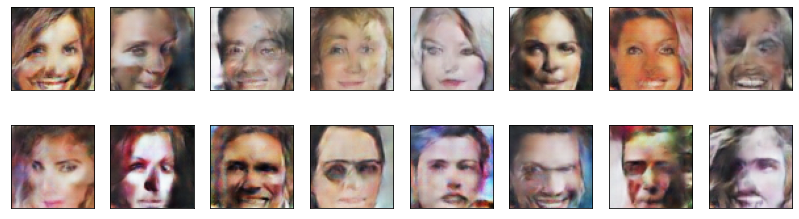

2023-08-28 12:21:31 | Epoch [45/50] | Batch 0/509 | d_loss: 0.3731 | g_loss: 5.1544
2023-08-28 12:21:32 | Epoch [45/50] | Batch 5/509 | d_loss: 0.3800 | g_loss: 6.7285
2023-08-28 12:21:33 | Epoch [45/50] | Batch 10/509 | d_loss: 0.3999 | g_loss: 4.3405
2023-08-28 12:21:34 | Epoch [45/50] | Batch 15/509 | d_loss: 0.3988 | g_loss: 4.0283
2023-08-28 12:21:35 | Epoch [45/50] | Batch 20/509 | d_loss: 0.3927 | g_loss: 3.7712
2023-08-28 12:21:36 | Epoch [45/50] | Batch 25/509 | d_loss: 0.4114 | g_loss: 2.9831
2023-08-28 12:21:37 | Epoch [45/50] | Batch 30/509 | d_loss: 0.3630 | g_loss: 3.5772
2023-08-28 12:21:38 | Epoch [45/50] | Batch 35/509 | d_loss: 0.4090 | g_loss: 3.4693
2023-08-28 12:21:39 | Epoch [45/50] | Batch 40/509 | d_loss: 0.9752 | g_loss: 4.2075
2023-08-28 12:21:40 | Epoch [45/50] | Batch 45/509 | d_loss: 0.4322 | g_loss: 4.3857
2023-08-28 12:21:41 | Epoch [45/50] | Batch 50/509 | d_loss: 0.4544 | g_loss: 3.2705
2023-08-28 12:21:42 | Epoch [45/50] | Batch 55/509 | d_loss: 0.3709

2023-08-28 12:23:10 | Epoch [45/50] | Batch 480/509 | d_loss: 0.3765 | g_loss: 3.8100
2023-08-28 12:23:11 | Epoch [45/50] | Batch 485/509 | d_loss: 0.3943 | g_loss: 3.7931
2023-08-28 12:23:12 | Epoch [45/50] | Batch 490/509 | d_loss: 0.3656 | g_loss: 6.1247
2023-08-28 12:23:13 | Epoch [45/50] | Batch 495/509 | d_loss: 0.5735 | g_loss: 2.7753
2023-08-28 12:23:15 | Epoch [45/50] | Batch 500/509 | d_loss: 0.4290 | g_loss: 4.9617
2023-08-28 12:23:15 | Epoch [45/50] | Batch 505/509 | d_loss: 0.3879 | g_loss: 3.4889


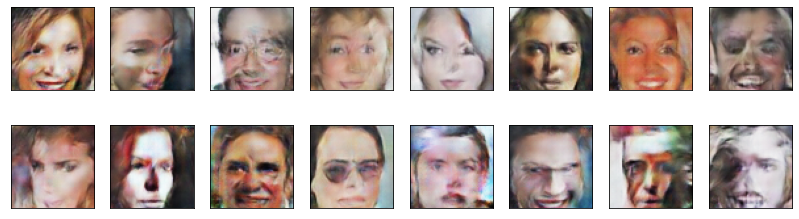

2023-08-28 12:23:20 | Epoch [46/50] | Batch 0/509 | d_loss: 0.3868 | g_loss: 6.4628
2023-08-28 12:23:21 | Epoch [46/50] | Batch 5/509 | d_loss: 0.3618 | g_loss: 5.7873
2023-08-28 12:23:22 | Epoch [46/50] | Batch 10/509 | d_loss: 0.3722 | g_loss: 5.4454
2023-08-28 12:23:23 | Epoch [46/50] | Batch 15/509 | d_loss: 0.3537 | g_loss: 4.1418
2023-08-28 12:23:24 | Epoch [46/50] | Batch 20/509 | d_loss: 0.3589 | g_loss: 5.7711
2023-08-28 12:23:25 | Epoch [46/50] | Batch 25/509 | d_loss: 0.6249 | g_loss: 4.9521
2023-08-28 12:23:26 | Epoch [46/50] | Batch 30/509 | d_loss: 0.4679 | g_loss: 4.8494
2023-08-28 12:23:27 | Epoch [46/50] | Batch 35/509 | d_loss: 0.3771 | g_loss: 3.4129
2023-08-28 12:23:28 | Epoch [46/50] | Batch 40/509 | d_loss: 0.3541 | g_loss: 6.1593
2023-08-28 12:23:29 | Epoch [46/50] | Batch 45/509 | d_loss: 0.4066 | g_loss: 5.7309
2023-08-28 12:23:30 | Epoch [46/50] | Batch 50/509 | d_loss: 0.3928 | g_loss: 3.3272
2023-08-28 12:23:31 | Epoch [46/50] | Batch 55/509 | d_loss: 0.3707

2023-08-28 12:25:00 | Epoch [46/50] | Batch 480/509 | d_loss: 0.3695 | g_loss: 4.4691
2023-08-28 12:25:01 | Epoch [46/50] | Batch 485/509 | d_loss: 0.3506 | g_loss: 7.8575
2023-08-28 12:25:02 | Epoch [46/50] | Batch 490/509 | d_loss: 0.3630 | g_loss: 4.9263
2023-08-28 12:25:03 | Epoch [46/50] | Batch 495/509 | d_loss: 0.4141 | g_loss: 4.1629
2023-08-28 12:25:04 | Epoch [46/50] | Batch 500/509 | d_loss: 0.4290 | g_loss: 4.0597
2023-08-28 12:25:05 | Epoch [46/50] | Batch 505/509 | d_loss: 0.3584 | g_loss: 5.9234


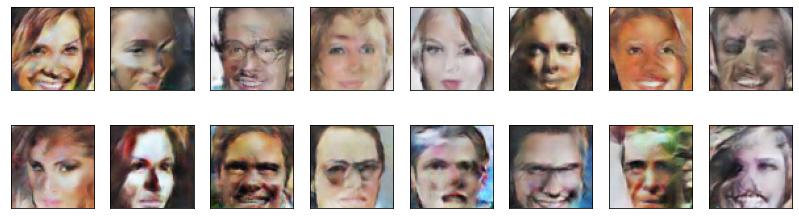

2023-08-28 12:25:11 | Epoch [47/50] | Batch 0/509 | d_loss: 0.4200 | g_loss: 4.9661
2023-08-28 12:25:12 | Epoch [47/50] | Batch 5/509 | d_loss: 0.5883 | g_loss: 6.6161
2023-08-28 12:25:13 | Epoch [47/50] | Batch 10/509 | d_loss: 0.9055 | g_loss: 5.7614
2023-08-28 12:25:14 | Epoch [47/50] | Batch 15/509 | d_loss: 0.6056 | g_loss: 4.2984
2023-08-28 12:25:15 | Epoch [47/50] | Batch 20/509 | d_loss: 0.3602 | g_loss: 4.9285
2023-08-28 12:25:16 | Epoch [47/50] | Batch 25/509 | d_loss: 0.3912 | g_loss: 3.6520
2023-08-28 12:25:17 | Epoch [47/50] | Batch 30/509 | d_loss: 0.3718 | g_loss: 3.8452
2023-08-28 12:25:18 | Epoch [47/50] | Batch 35/509 | d_loss: 0.3631 | g_loss: 3.9882
2023-08-28 12:25:19 | Epoch [47/50] | Batch 40/509 | d_loss: 0.3721 | g_loss: 3.5963
2023-08-28 12:25:20 | Epoch [47/50] | Batch 45/509 | d_loss: 0.4006 | g_loss: 4.0072
2023-08-28 12:25:22 | Epoch [47/50] | Batch 50/509 | d_loss: 0.3873 | g_loss: 4.8361
2023-08-28 12:25:23 | Epoch [47/50] | Batch 55/509 | d_loss: 0.4212

2023-08-28 12:26:50 | Epoch [47/50] | Batch 480/509 | d_loss: 0.3619 | g_loss: 4.6865
2023-08-28 12:26:51 | Epoch [47/50] | Batch 485/509 | d_loss: 2.6555 | g_loss: 1.0768
2023-08-28 12:26:52 | Epoch [47/50] | Batch 490/509 | d_loss: 2.3272 | g_loss: 6.7189
2023-08-28 12:26:54 | Epoch [47/50] | Batch 495/509 | d_loss: 0.7061 | g_loss: 5.2726
2023-08-28 12:26:55 | Epoch [47/50] | Batch 500/509 | d_loss: 0.7095 | g_loss: 3.6611
2023-08-28 12:26:55 | Epoch [47/50] | Batch 505/509 | d_loss: 0.4391 | g_loss: 3.4865


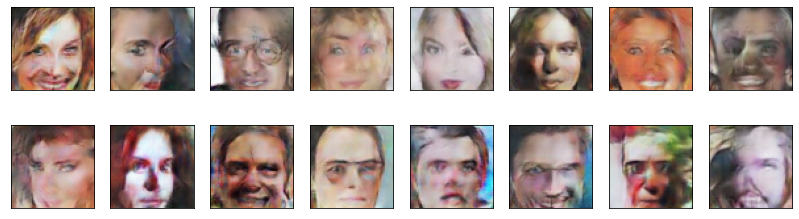

2023-08-28 12:27:01 | Epoch [48/50] | Batch 0/509 | d_loss: 0.4783 | g_loss: 4.2343
2023-08-28 12:27:02 | Epoch [48/50] | Batch 5/509 | d_loss: 0.4094 | g_loss: 3.5915
2023-08-28 12:27:03 | Epoch [48/50] | Batch 10/509 | d_loss: 0.5172 | g_loss: 2.7884
2023-08-28 12:27:04 | Epoch [48/50] | Batch 15/509 | d_loss: 0.4869 | g_loss: 3.5073
2023-08-28 12:27:05 | Epoch [48/50] | Batch 20/509 | d_loss: 0.3913 | g_loss: 4.1581
2023-08-28 12:27:06 | Epoch [48/50] | Batch 25/509 | d_loss: 0.3971 | g_loss: 3.7979
2023-08-28 12:27:07 | Epoch [48/50] | Batch 30/509 | d_loss: 0.7543 | g_loss: 2.6997
2023-08-28 12:27:08 | Epoch [48/50] | Batch 35/509 | d_loss: 0.3743 | g_loss: 4.5991
2023-08-28 12:27:09 | Epoch [48/50] | Batch 40/509 | d_loss: 0.4462 | g_loss: 3.3361
2023-08-28 12:27:10 | Epoch [48/50] | Batch 45/509 | d_loss: 0.4552 | g_loss: 3.4805
2023-08-28 12:27:11 | Epoch [48/50] | Batch 50/509 | d_loss: 0.4242 | g_loss: 3.1768
2023-08-28 12:27:12 | Epoch [48/50] | Batch 55/509 | d_loss: 0.3716

2023-08-28 12:28:39 | Epoch [48/50] | Batch 480/509 | d_loss: 0.5454 | g_loss: 4.8841
2023-08-28 12:28:40 | Epoch [48/50] | Batch 485/509 | d_loss: 0.4267 | g_loss: 4.0197
2023-08-28 12:28:41 | Epoch [48/50] | Batch 490/509 | d_loss: 0.4213 | g_loss: 3.3807
2023-08-28 12:28:42 | Epoch [48/50] | Batch 495/509 | d_loss: 0.4716 | g_loss: 4.3301
2023-08-28 12:28:43 | Epoch [48/50] | Batch 500/509 | d_loss: 0.3916 | g_loss: 4.1713
2023-08-28 12:28:44 | Epoch [48/50] | Batch 505/509 | d_loss: 0.6078 | g_loss: 6.1531


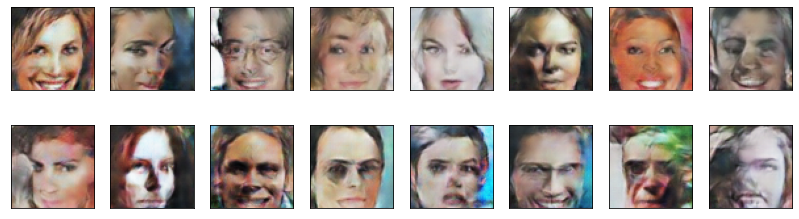

2023-08-28 12:28:49 | Epoch [49/50] | Batch 0/509 | d_loss: 0.4363 | g_loss: 2.7523
2023-08-28 12:28:51 | Epoch [49/50] | Batch 5/509 | d_loss: 0.4781 | g_loss: 3.3868
2023-08-28 12:28:52 | Epoch [49/50] | Batch 10/509 | d_loss: 0.6475 | g_loss: 2.5123
2023-08-28 12:28:53 | Epoch [49/50] | Batch 15/509 | d_loss: 0.3838 | g_loss: 4.6459
2023-08-28 12:28:54 | Epoch [49/50] | Batch 20/509 | d_loss: 0.4293 | g_loss: 3.3722
2023-08-28 12:28:55 | Epoch [49/50] | Batch 25/509 | d_loss: 0.5453 | g_loss: 4.7399
2023-08-28 12:28:56 | Epoch [49/50] | Batch 30/509 | d_loss: 0.5398 | g_loss: 3.6201
2023-08-28 12:28:57 | Epoch [49/50] | Batch 35/509 | d_loss: 0.4568 | g_loss: 4.1803
2023-08-28 12:28:58 | Epoch [49/50] | Batch 40/509 | d_loss: 0.4321 | g_loss: 3.8070
2023-08-28 12:28:59 | Epoch [49/50] | Batch 45/509 | d_loss: 0.3894 | g_loss: 4.3046
2023-08-28 12:29:00 | Epoch [49/50] | Batch 50/509 | d_loss: 0.3488 | g_loss: 6.6410
2023-08-28 12:29:02 | Epoch [49/50] | Batch 55/509 | d_loss: 0.4688

2023-08-28 12:30:29 | Epoch [49/50] | Batch 480/509 | d_loss: 0.4102 | g_loss: 4.3139
2023-08-28 12:30:30 | Epoch [49/50] | Batch 485/509 | d_loss: 0.3503 | g_loss: 4.2875
2023-08-28 12:30:31 | Epoch [49/50] | Batch 490/509 | d_loss: 0.4104 | g_loss: 3.0851
2023-08-28 12:30:32 | Epoch [49/50] | Batch 495/509 | d_loss: 0.3651 | g_loss: 4.5053
2023-08-28 12:30:33 | Epoch [49/50] | Batch 500/509 | d_loss: 0.3801 | g_loss: 4.2509
2023-08-28 12:30:34 | Epoch [49/50] | Batch 505/509 | d_loss: 0.3630 | g_loss: 4.8896


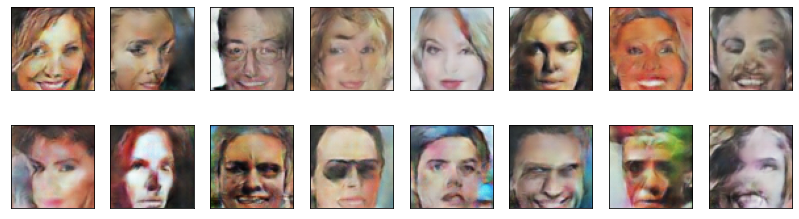

2023-08-28 12:30:39 | Epoch [50/50] | Batch 0/509 | d_loss: 0.3498 | g_loss: 5.3192
2023-08-28 12:30:40 | Epoch [50/50] | Batch 5/509 | d_loss: 0.3665 | g_loss: 4.1155
2023-08-28 12:30:41 | Epoch [50/50] | Batch 10/509 | d_loss: 0.3603 | g_loss: 4.0110
2023-08-28 12:30:42 | Epoch [50/50] | Batch 15/509 | d_loss: 0.4240 | g_loss: 4.5529
2023-08-28 12:30:43 | Epoch [50/50] | Batch 20/509 | d_loss: 0.3428 | g_loss: 6.7184
2023-08-28 12:30:44 | Epoch [50/50] | Batch 25/509 | d_loss: 0.3443 | g_loss: 6.1356
2023-08-28 12:30:45 | Epoch [50/50] | Batch 30/509 | d_loss: 0.3933 | g_loss: 3.8884
2023-08-28 12:30:46 | Epoch [50/50] | Batch 35/509 | d_loss: 0.3694 | g_loss: 3.9639
2023-08-28 12:30:47 | Epoch [50/50] | Batch 40/509 | d_loss: 0.3895 | g_loss: 4.1696
2023-08-28 12:30:48 | Epoch [50/50] | Batch 45/509 | d_loss: 0.6934 | g_loss: 4.0430
2023-08-28 12:30:49 | Epoch [50/50] | Batch 50/509 | d_loss: 0.3591 | g_loss: 5.9661
2023-08-28 12:30:50 | Epoch [50/50] | Batch 55/509 | d_loss: 0.3477

2023-08-28 12:32:19 | Epoch [50/50] | Batch 480/509 | d_loss: 0.3742 | g_loss: 4.2679
2023-08-28 12:32:21 | Epoch [50/50] | Batch 485/509 | d_loss: 0.4248 | g_loss: 3.3687
2023-08-28 12:32:22 | Epoch [50/50] | Batch 490/509 | d_loss: 0.7115 | g_loss: 1.1914
2023-08-28 12:32:23 | Epoch [50/50] | Batch 495/509 | d_loss: 0.3936 | g_loss: 5.2210
2023-08-28 12:32:24 | Epoch [50/50] | Batch 500/509 | d_loss: 0.5498 | g_loss: 4.6004
2023-08-28 12:32:25 | Epoch [50/50] | Batch 505/509 | d_loss: 0.3652 | g_loss: 6.3006


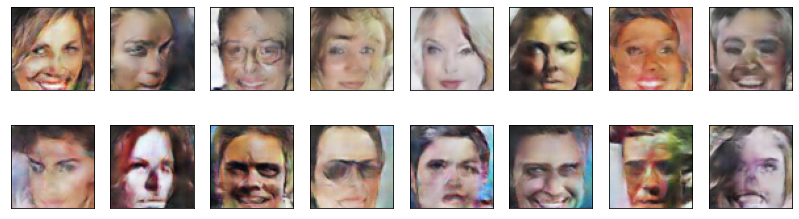

In [32]:


fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        real_images = scale(real_images)
        ####################################
        
        # TODO: implement the training strategy
               
        d_loss = discriminator_step(batch_size, latent_dim, real_images)
        
        g_loss = generator_step(batch_size, latent_dim)
        
        ####################################
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
            save_model(discriminator, generator, d_optimizer, g_optimizer)
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

with open('generated_images.pkl', 'wb') as f:
    pkl.dump(generated_images, f)

### Training losses

Plot the training losses for the generator and discriminator.

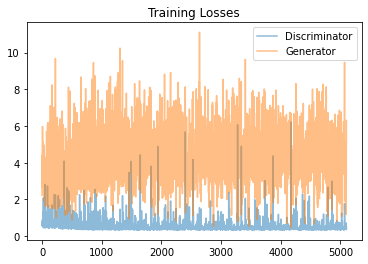

In [33]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 

The generated images of humans are white because of the dataset
Large model means adding more layers will give better results because it can learn more features in data space
Optimization function and selection of learning rate can improve the training of face generation
Training with more epochs yes will improve results
Adding a dropout layer to stop training when the result degrades
Switching the loss function can improve the results like the Wasserstein loss
Switching the activation function can also improve results

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.